In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import spatialdata_io
import spatialdata as sd
from tqdm import tqdm
import scanpy as sc
import networkx as nx
import sys
sys.path.append("../../src")
import troutpy 

/home/sergio/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/sergio/.local/lib/python3.10/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/home/sergio/.local/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/sergio/.local/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
xenium_path_cropped='/media/sergio/Discovair_final/mousebrain_prime_crop_points2regions_annotated.zarr'
output_path='/media/sergio/Discovair_final/analysis_crop'
sdata=sd.read_zarr(xenium_path_cropped)

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argum

In [58]:
import pandas as pd
import numpy as np
import networkx as nx

def find_gene_groups(sdata, threshold=0.7, key='table',output_path:str='',save=True):
    # Extract the expression data from the provided key in sdata
    adata = sdata[key]
    expression = pd.DataFrame(adata.X.todense(), columns=adata.var.index)
    
    # Compute correlations and structure the results
    correlations = np.corrcoef(expression.T)
    results = pd.DataFrame(correlations, index=expression.columns, columns=expression.columns)
    
    # Unstack to create a DataFrame of gene pairs with correlation values
    sorted_Res = results.unstack().reset_index().sort_values(by=0)
    sorted_Res.columns = ['gene_1', 'gene_2', 'correlation']
    
    # Filter pairs where genes are different and correlation exceeds the threshold
    goodcomb = sorted_Res[sorted_Res['gene_1'] != sorted_Res['gene_2']]
    filtered_pairs = goodcomb[goodcomb['correlation'] > threshold]
    
    # Build a graph from the filtered gene pairs
    G = nx.Graph()
    G.add_edges_from(filtered_pairs[['gene_1', 'gene_2']].values)
    
    # Find connected components as groups of highly correlated genes
    gene_groups = {gene: i + 1 for i, component in enumerate(nx.connected_components(G)) for gene in component}
    
    # Create a DataFrame with all genes, assigning "No group" to ungrouped genes
    gene_to_group = [{'gene': gene, 'group': gene_groups.get(gene, "No group")} for gene in expression.columns]
    gene_groups_df = pd.DataFrame(gene_to_group)
    if save==True:
        gene_groups_df.to_csv(os.path.join(output_path,'genes_grouped_by_intracellular_expression.csv'))

    return gene_groups_df


In [59]:
gene_groups_intracellular_expression = find_gene_groups(sdata, threshold=0.7, key='table',output_path=output_path)

In [ ]:
extracellular_proportion=calculate_extracellular_proportion(sdata, output_path,save=False)

Group 1: ['Camk2b', 'Ptk2b', 'Prkcg', 'Plk2', 'Ppp3r1']


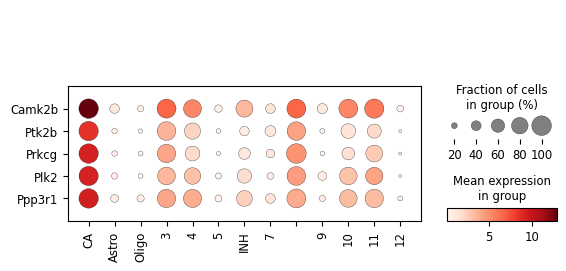

<Figure size 640x480 with 0 Axes>

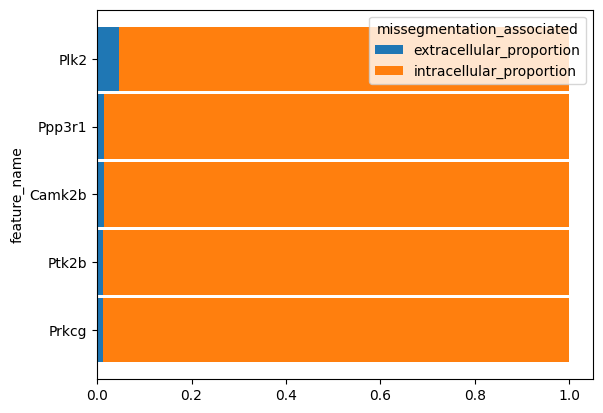

Group 2: ['Cyfip2', 'Uchl1', 'Eno2', 'Syp', 'Sncb', 'Rab3a', 'Snap25', 'Dnm1', 'Stxbp1']


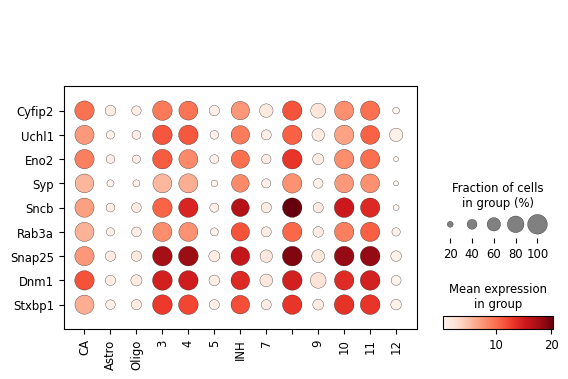

<Figure size 640x480 with 0 Axes>

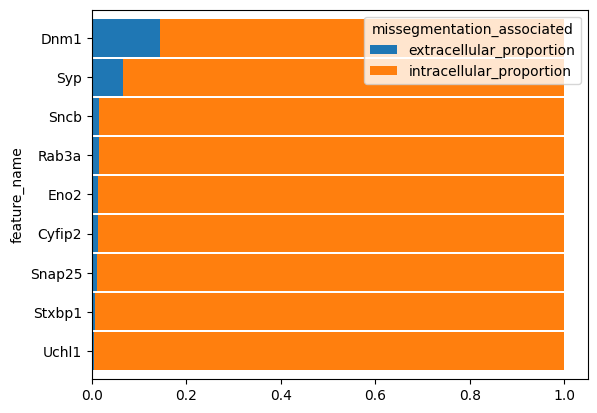

Group 3: ['Fn1', 'Acvrl1', 'Epas1', 'Slc2a1', 'Esam', 'Sox18', 'Abcb1a', 'Podxl', 'Eng', 'Flt1', 'Adgrf5', 'Pltp']


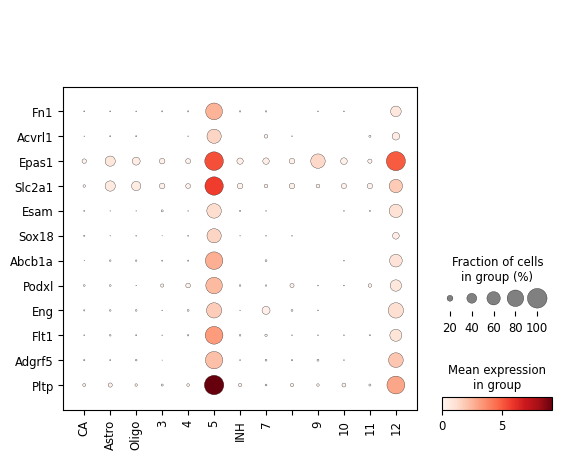

<Figure size 640x480 with 0 Axes>

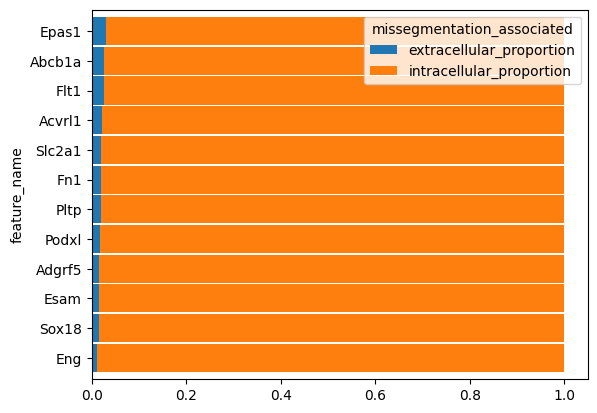

Group 4: ['Aldoc', 'Mlc1', 'Gja1', 'Gpr37l1', 'Slc1a3', 'Plpp3', 'Fgfr3', 'Ntsr2', 'S1pr1', 'Atp1b2']


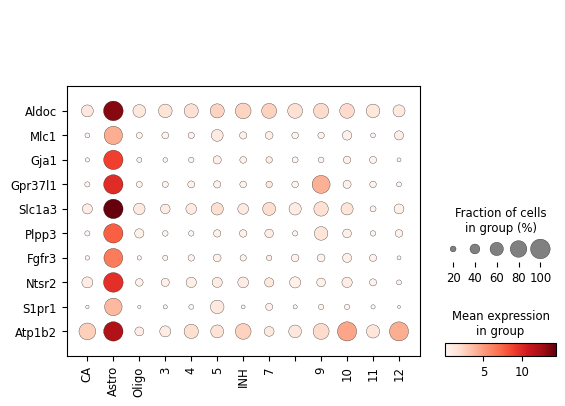

<Figure size 640x480 with 0 Axes>

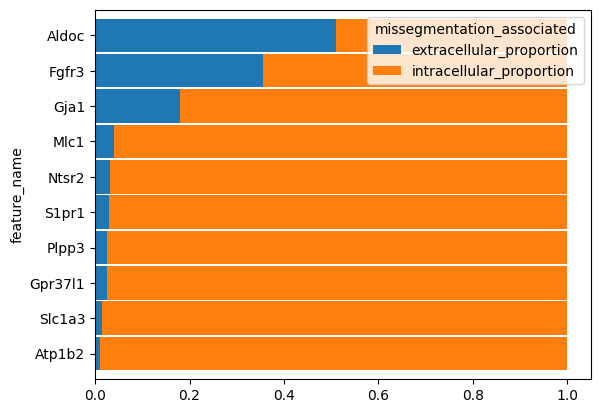

Group 5: ['Vtn', 'Pdgfrb', 'Cd248', 'Kcnj8', 'Heyl', 'Abcc9', 'Zic1', 'Notch3', 'Atp2a3', 'Ace2']


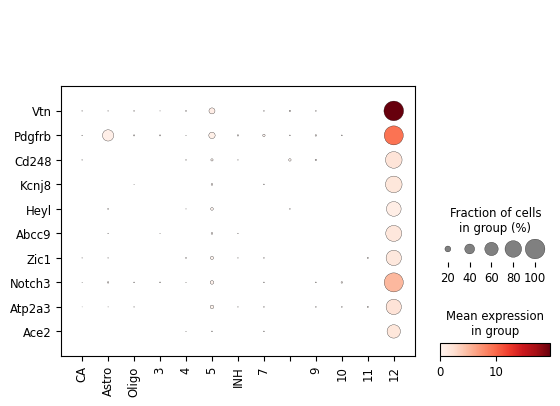

<Figure size 640x480 with 0 Axes>

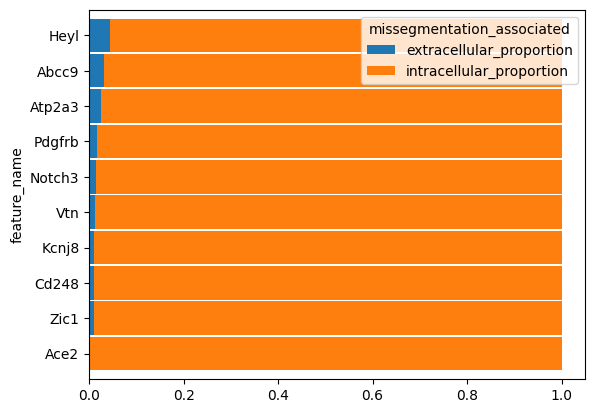

Group 6: ['Cnp', 'Mog', 'Aspa', 'Cntn2', 'Sept4', 'Efnb3', 'Cryab', 'Mag', 'Myrf', 'Nkx6-2', 'Ugt8a', 'Anln']


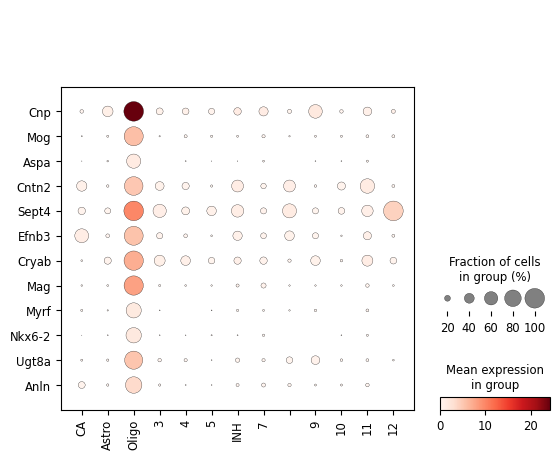

<Figure size 640x480 with 0 Axes>

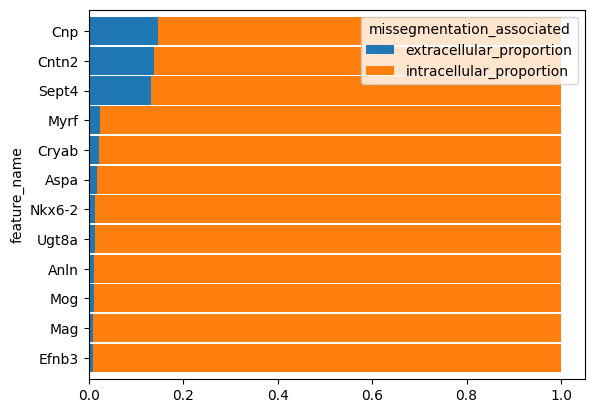

Group 7: ['Pln', 'Tagln', 'Cnn1', 'Myh11']


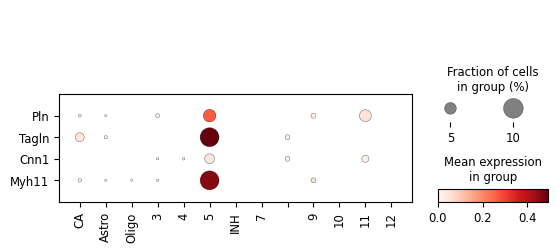

<Figure size 640x480 with 0 Axes>

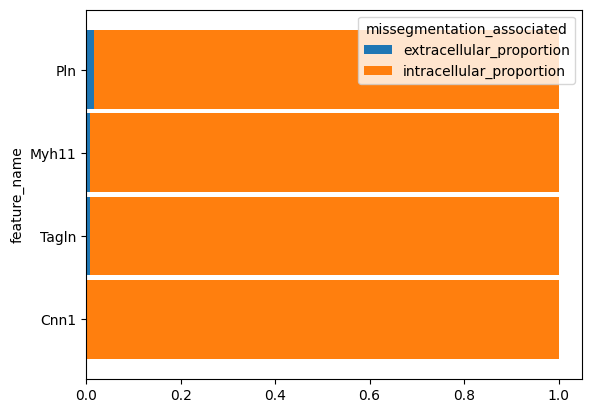

Group 8: ['Il10ra', 'Aif1', 'Slc2a5', 'Fcrls', 'Trem2', 'Cx3cr1', 'P2ry13', 'Csf1r', 'Fcgr3', 'Tmem119', 'Selplg', 'Vsir', 'Itgam']


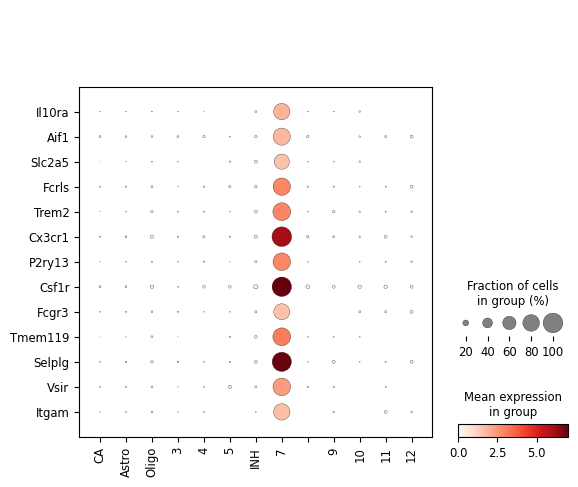

<Figure size 640x480 with 0 Axes>

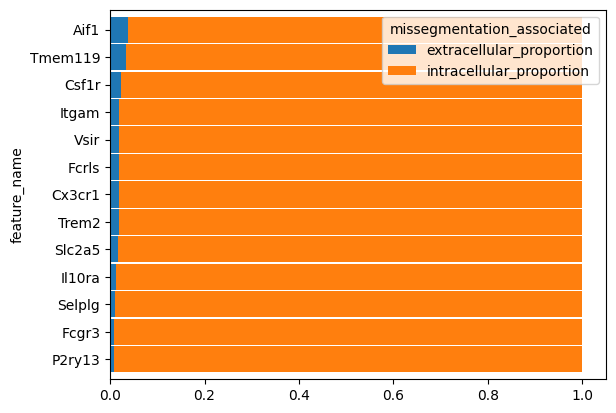

Group 9: ['Fcmr', 'Igkc', 'Cd79b', 'Cd19', 'Ms4a1', 'Cd79a']


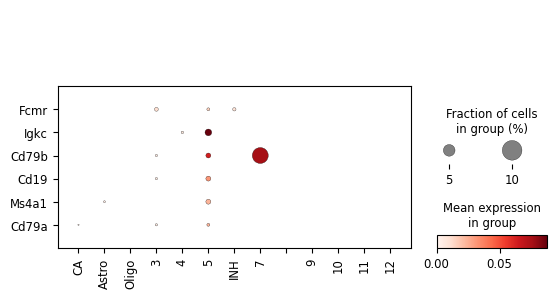

<Figure size 640x480 with 0 Axes>

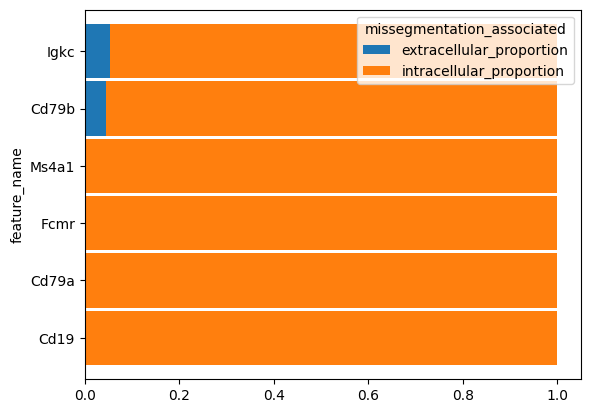

Group 10: ['Ebf2', 'Drd2', 'Gpa33', 'Ntf3']


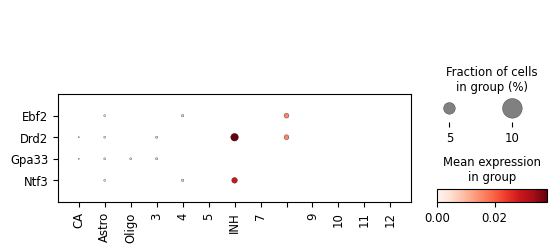

<Figure size 640x480 with 0 Axes>

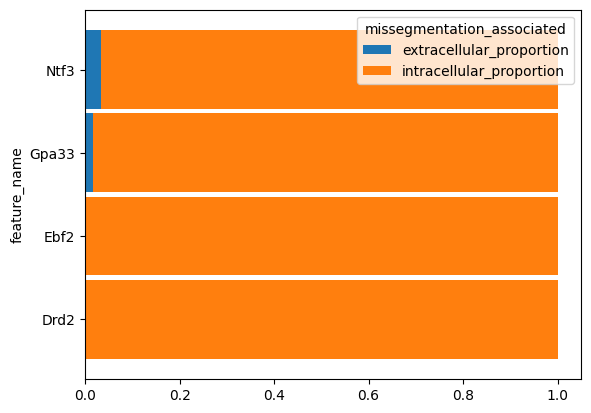

Group 11: ['Slc32a1', 'Gad1']


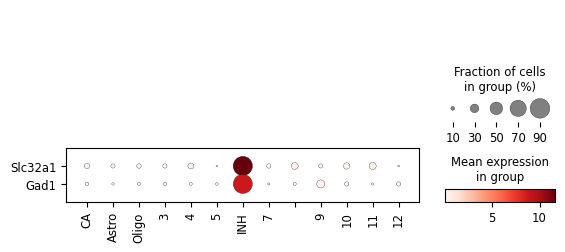

<Figure size 640x480 with 0 Axes>

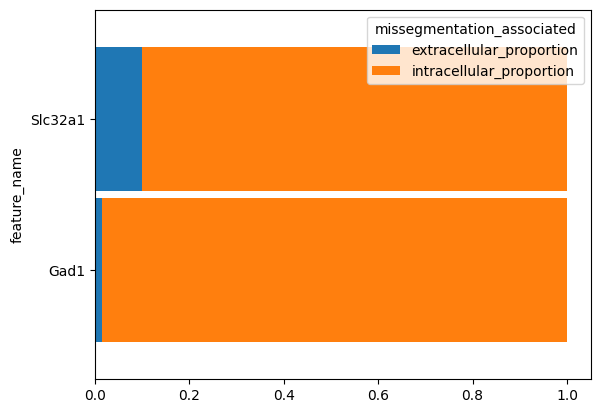

Group 12: ['Vcan', 'Pdgfra', 'C1ql1']


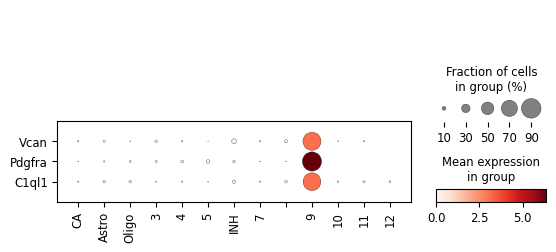

<Figure size 640x480 with 0 Axes>

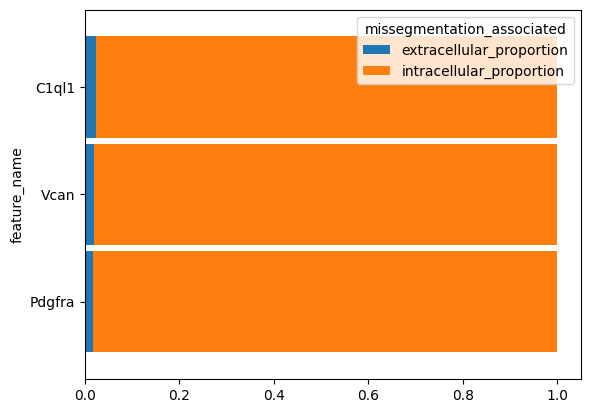

Group 13: ['Foxd1', 'Frk']


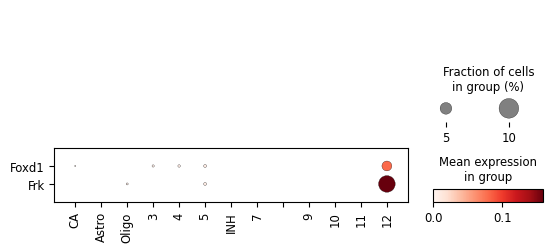

<Figure size 640x480 with 0 Axes>

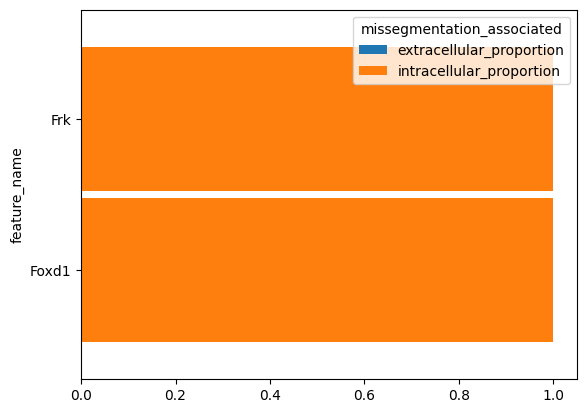

Group 14: ['Hoxb1', 'Ptgir']


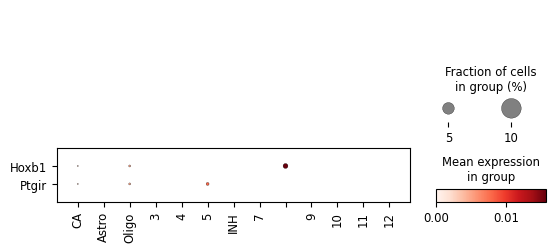

<Figure size 640x480 with 0 Axes>

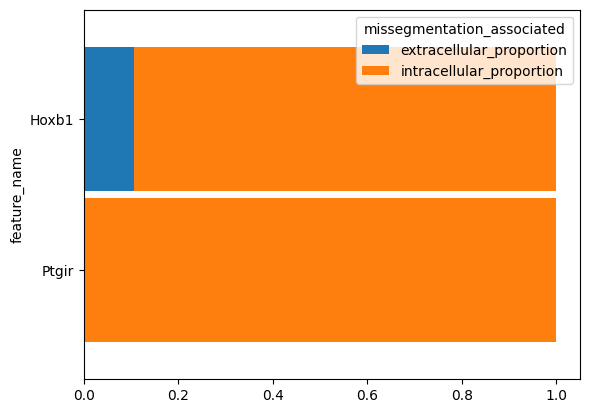

Group 15: ['Tnni3k', 'Tmprss15']


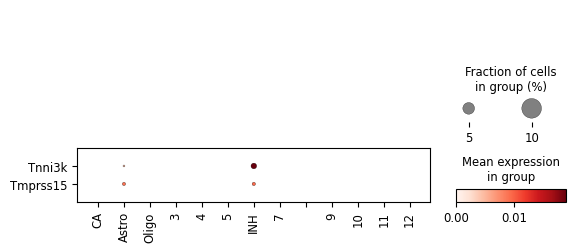

<Figure size 640x480 with 0 Axes>

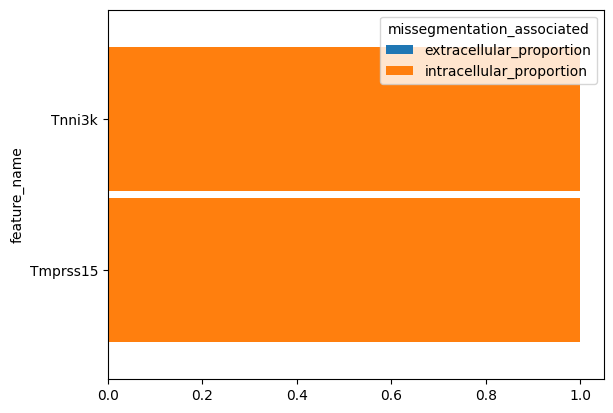

Group 16: ['Foxc2', 'Eya2']


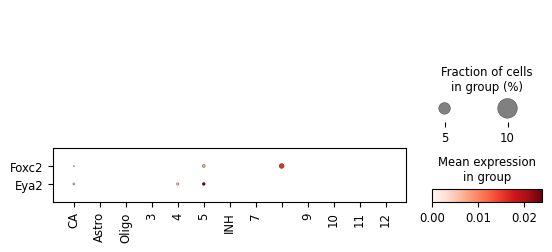

<Figure size 640x480 with 0 Axes>

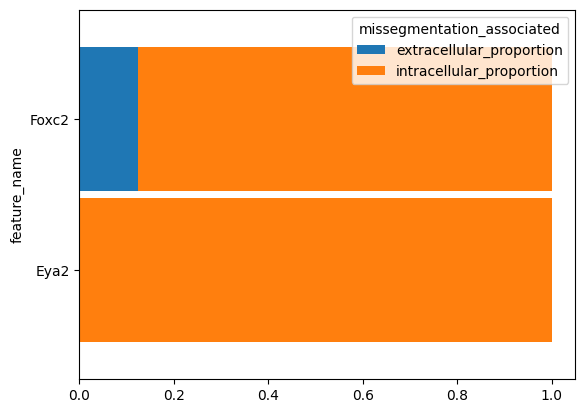

Group 17: ['Ccr6', 'Ighd']


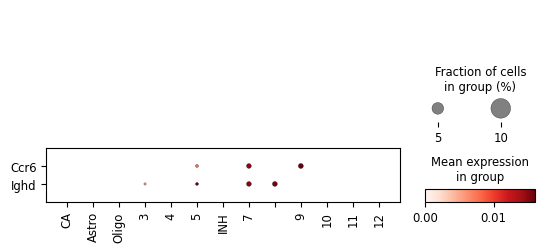

<Figure size 640x480 with 0 Axes>

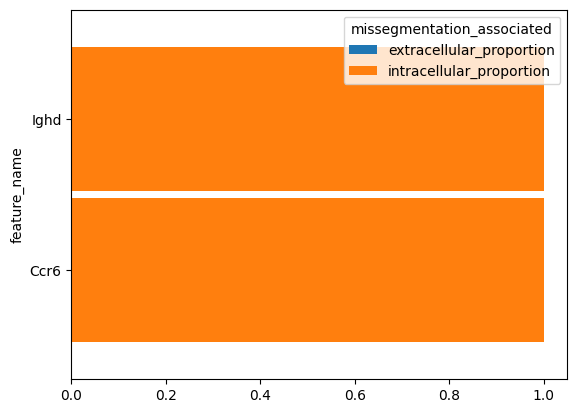

In [34]:
extracellular_proportion=calculate_extracellular_proportion(sdata, output_path,save=False)
for i, group in enumerate(gene_groups):
    print(f"Group {i+1}: {group}")
    sc.pl.dotplot(adata,group,groupby=key,swap_axes=True)
    extra_filt=extracellular_proportion.loc[extracellular_proportion.index.isin(group),:].sort_values(by='extracellular_proportion')
    plt.figure()
    extra_filt.plot(kind='barh',stacked=True,width=0.95)
    plt.show()

In [122]:
genes_of_interest.to_csv('/media/sergio/Discovair_final/genes_of_interest.csv')

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


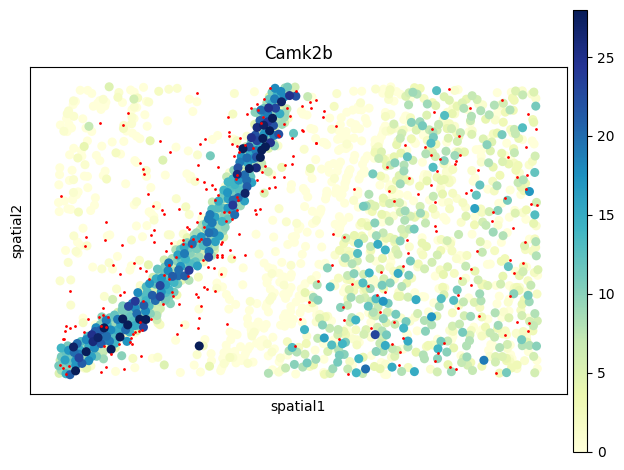

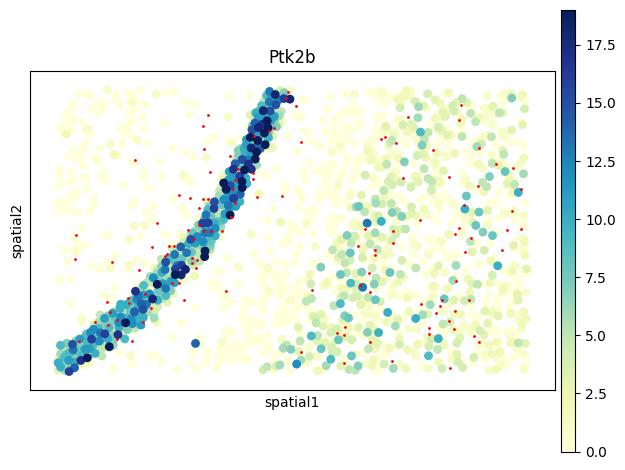

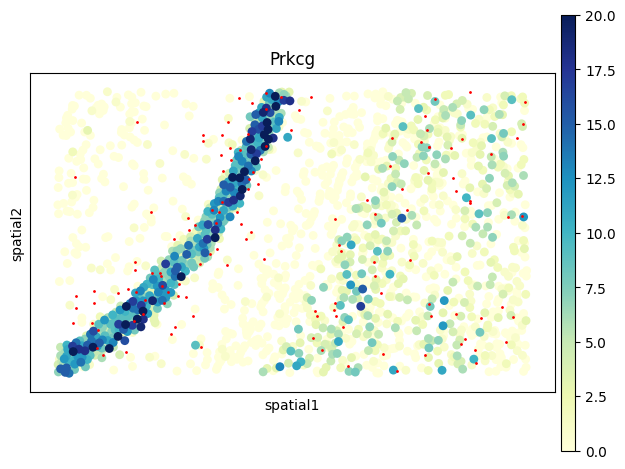

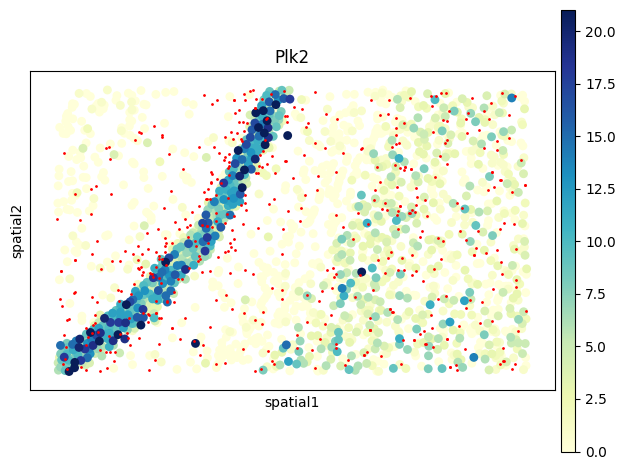

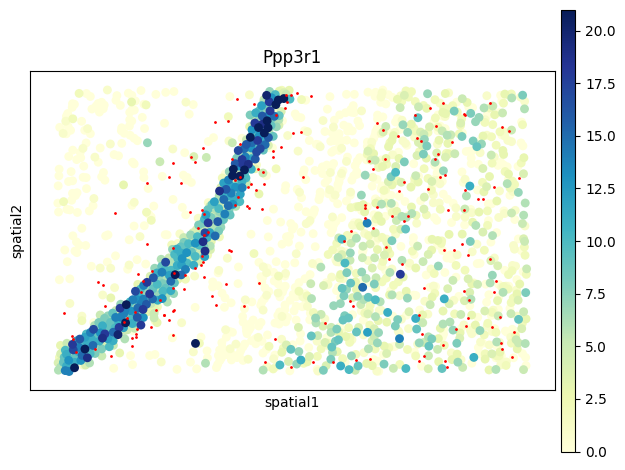

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


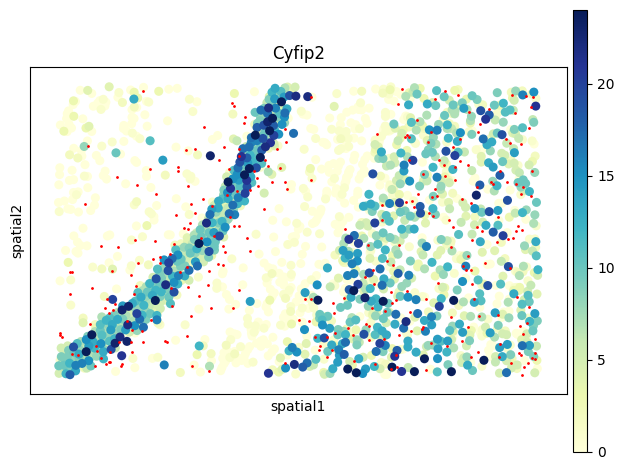

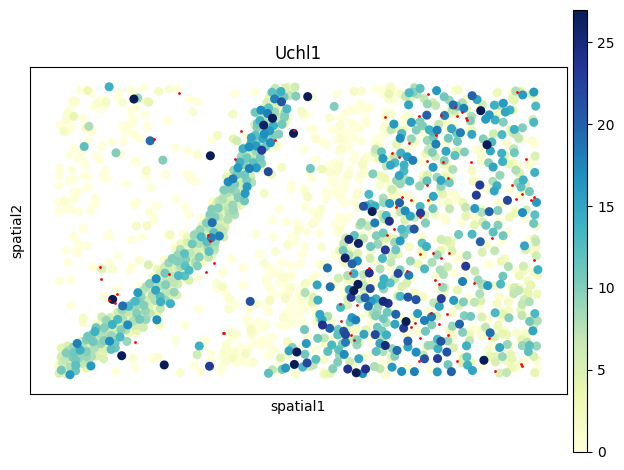

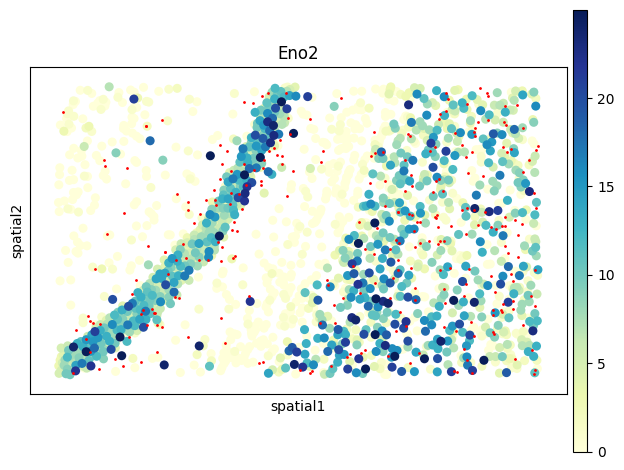

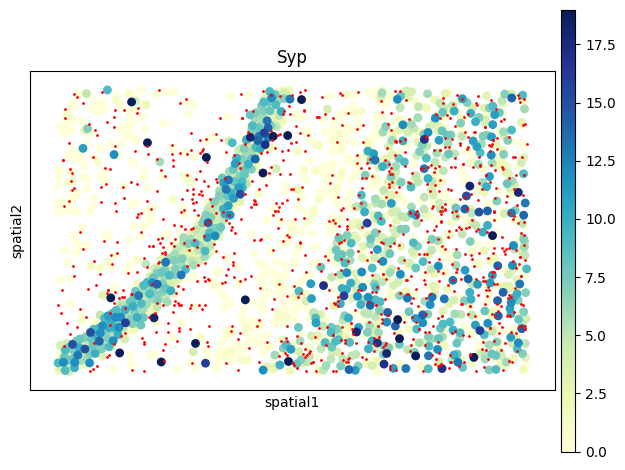

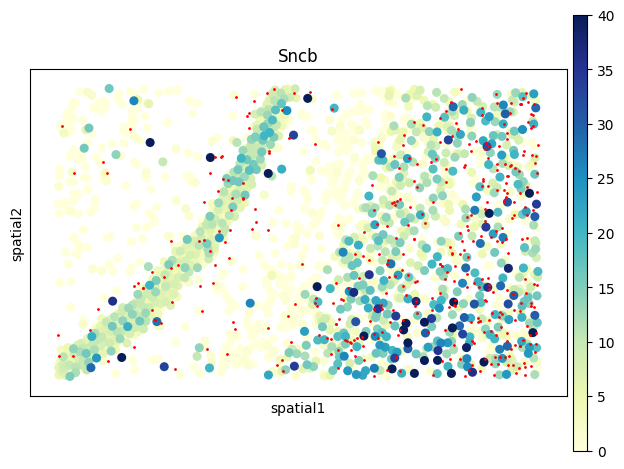

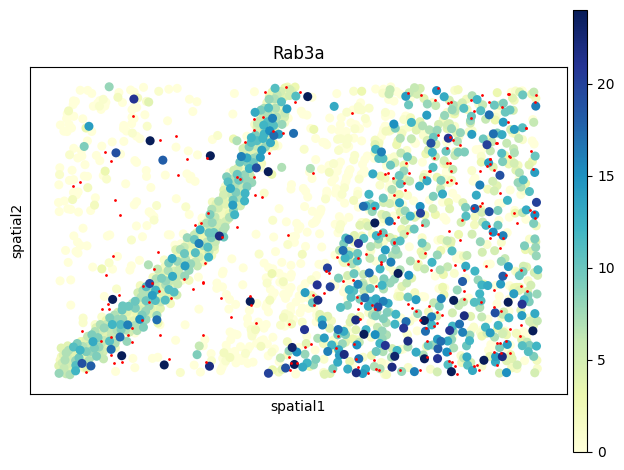

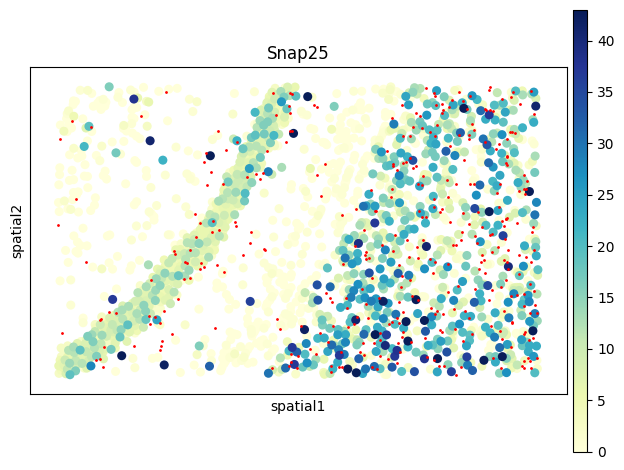

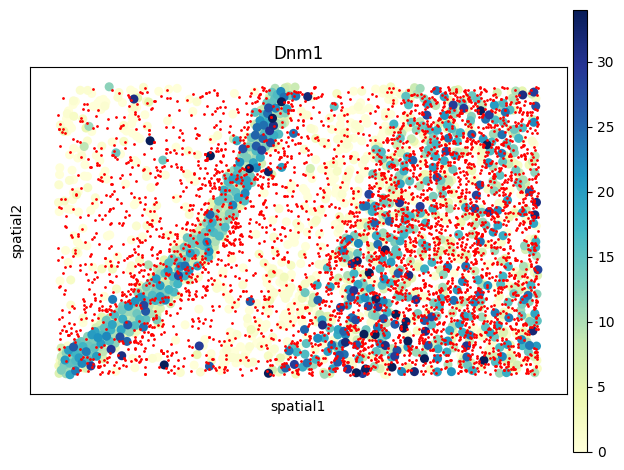

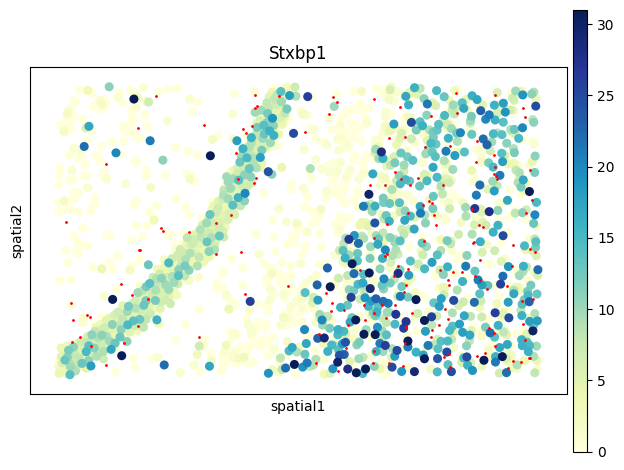

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


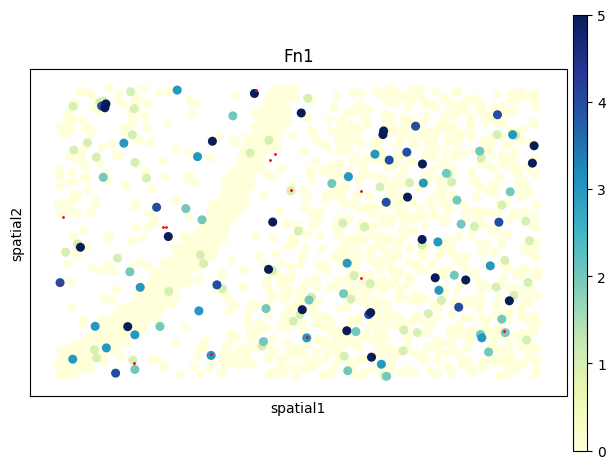

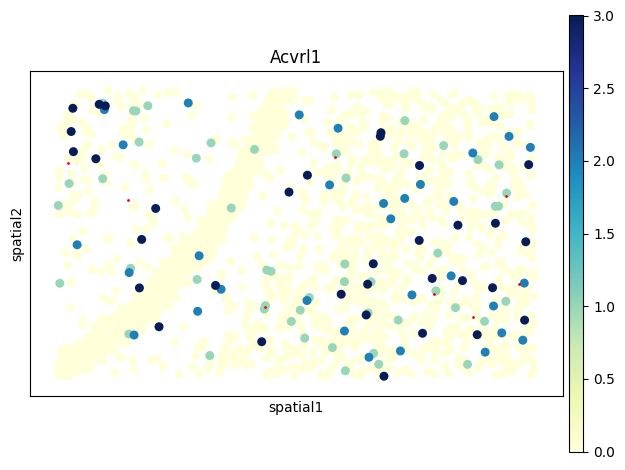

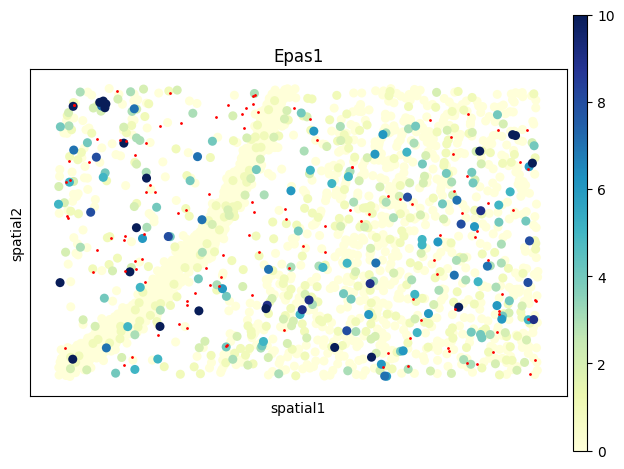

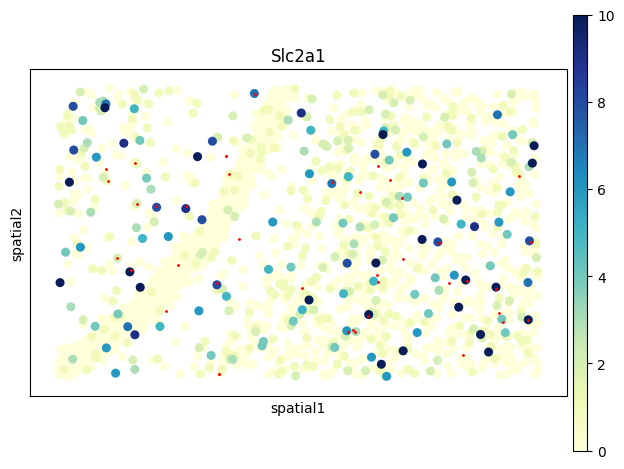

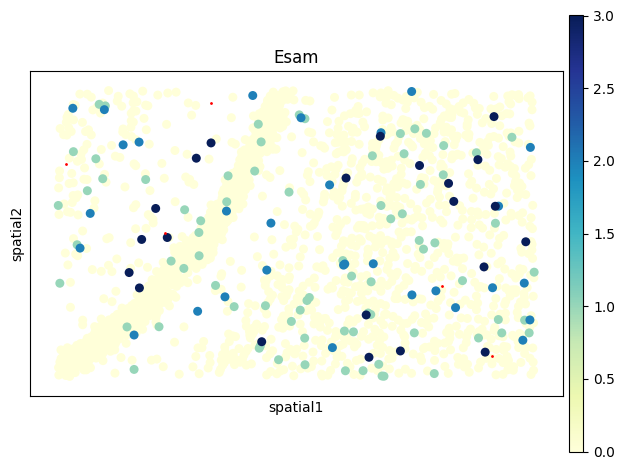

...

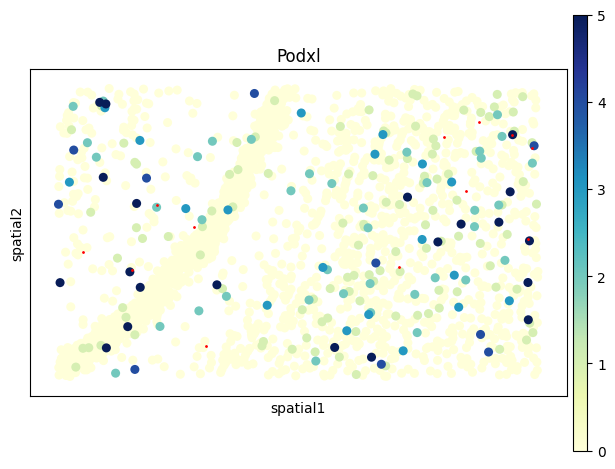

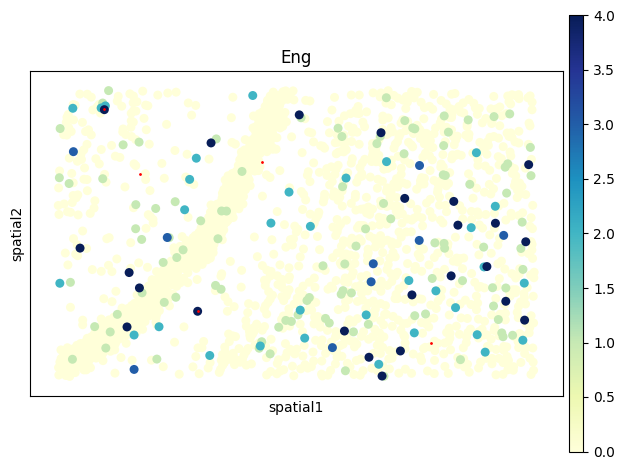

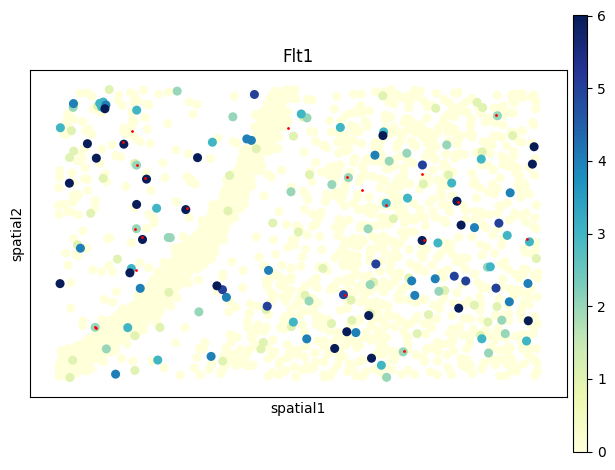

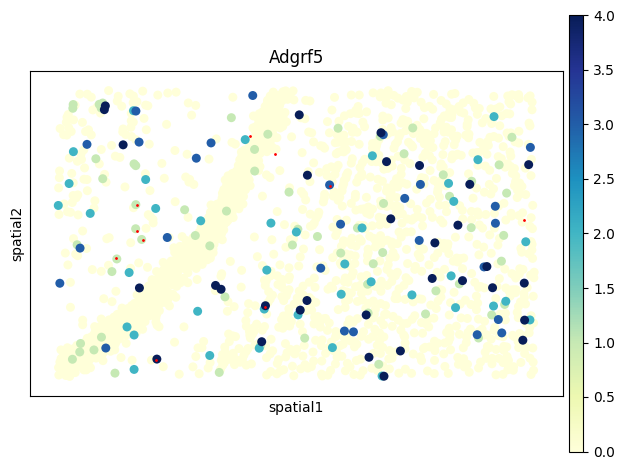

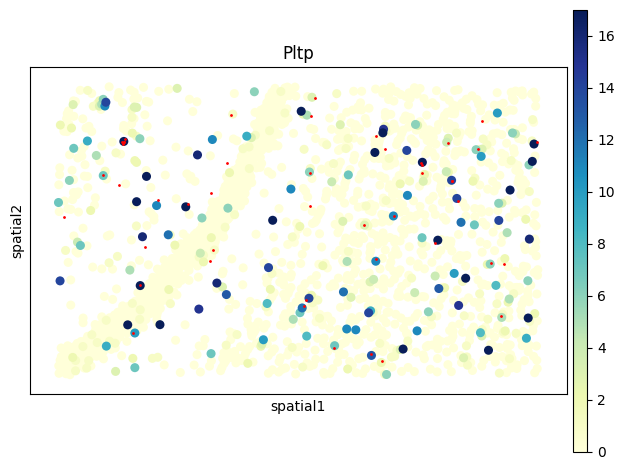

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


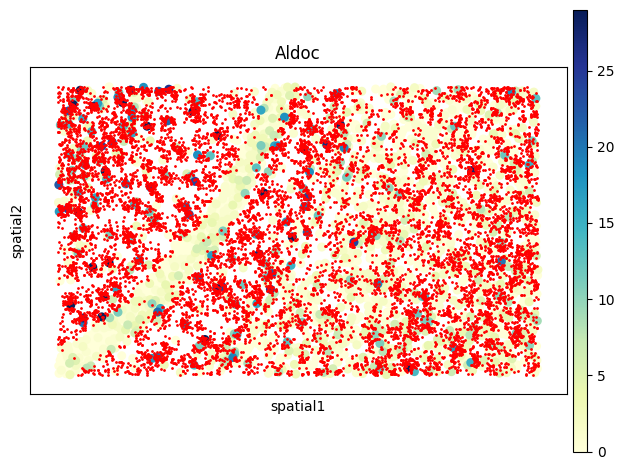

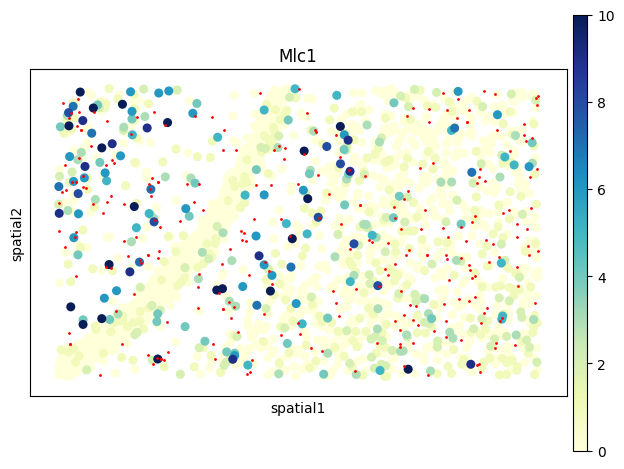

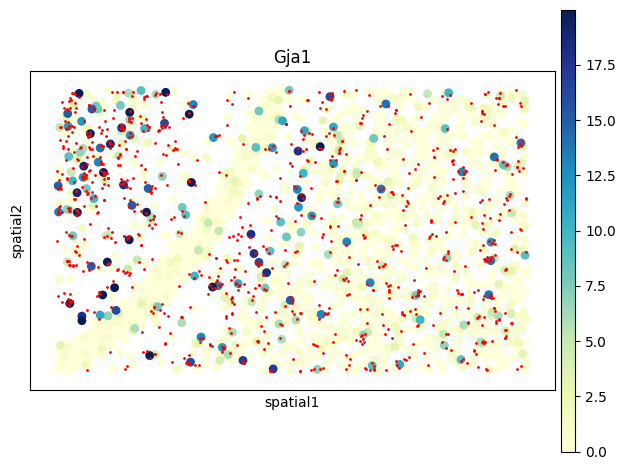

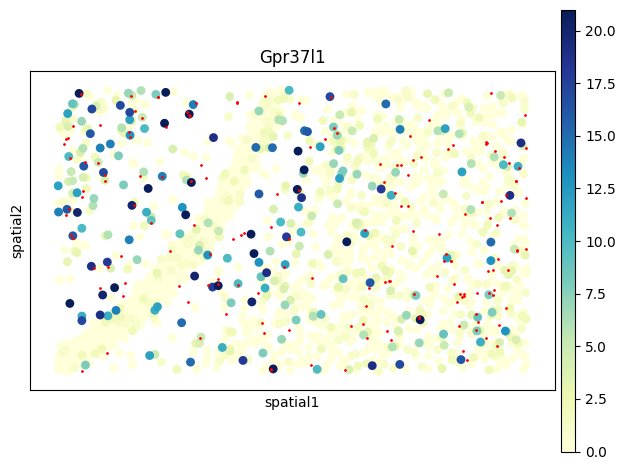

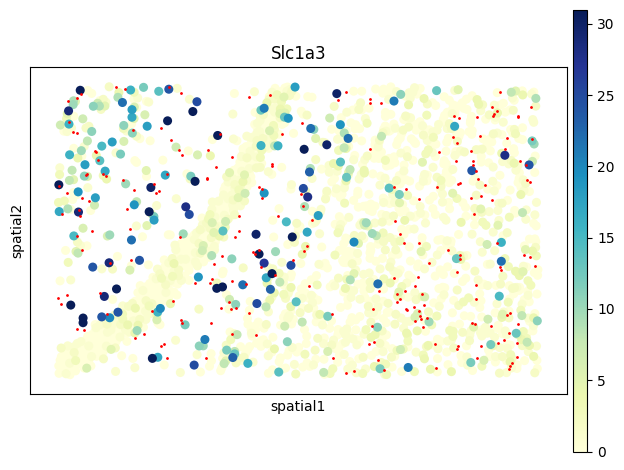

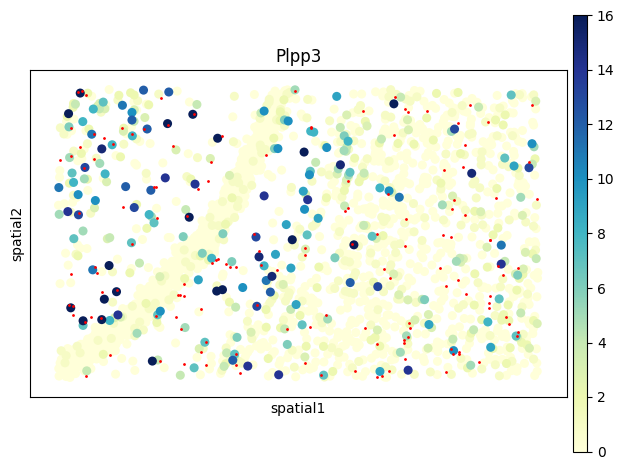

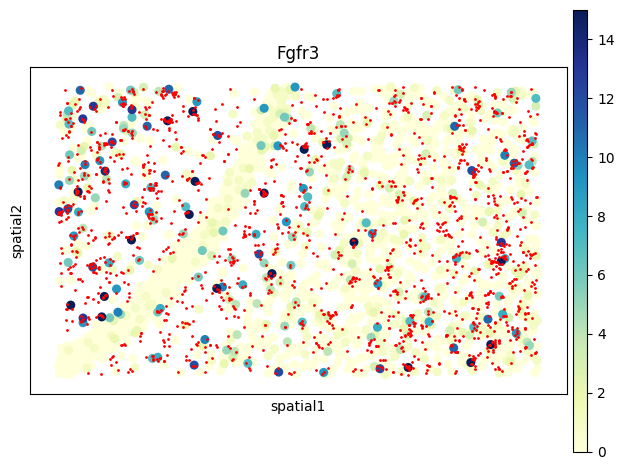

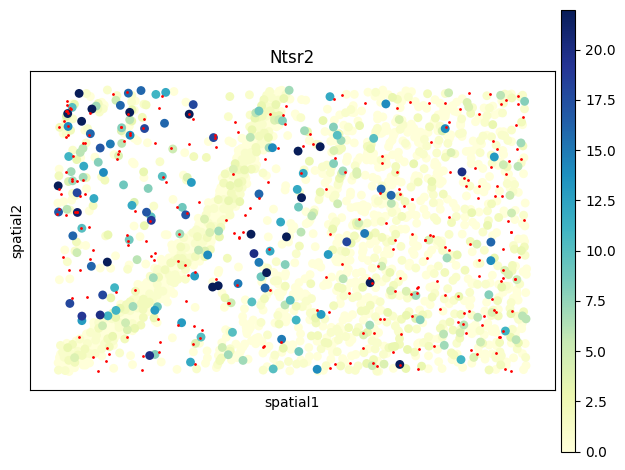

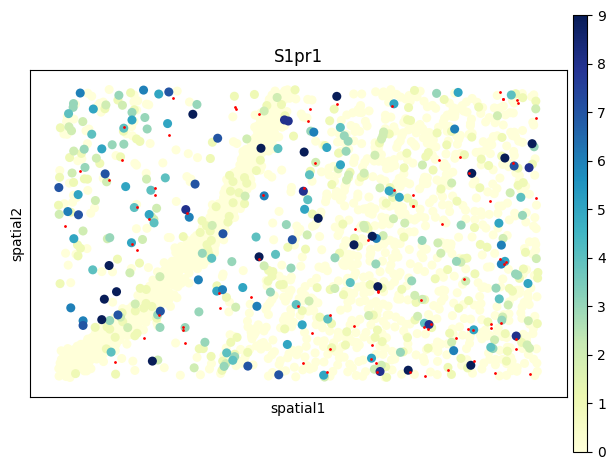

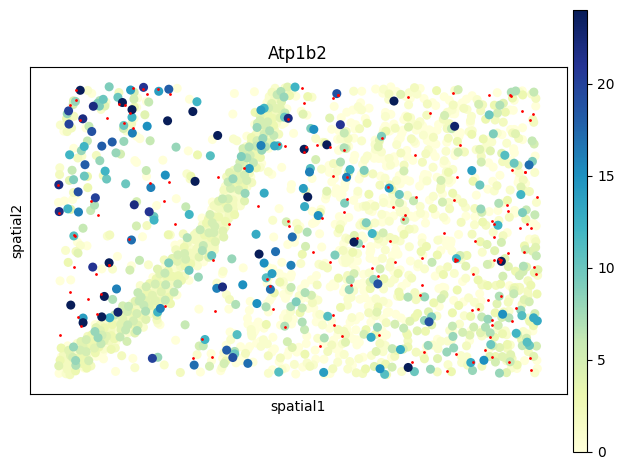

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


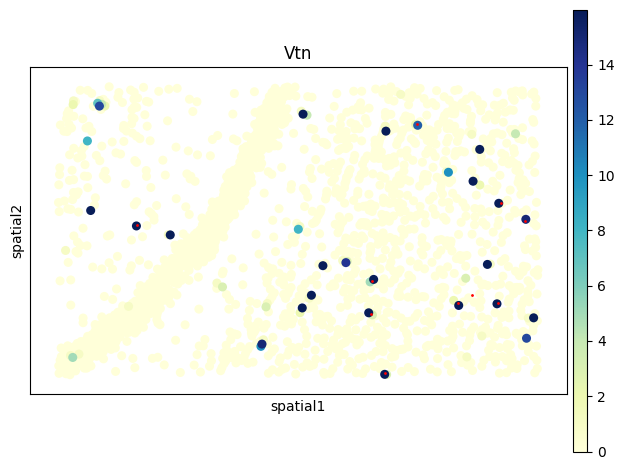

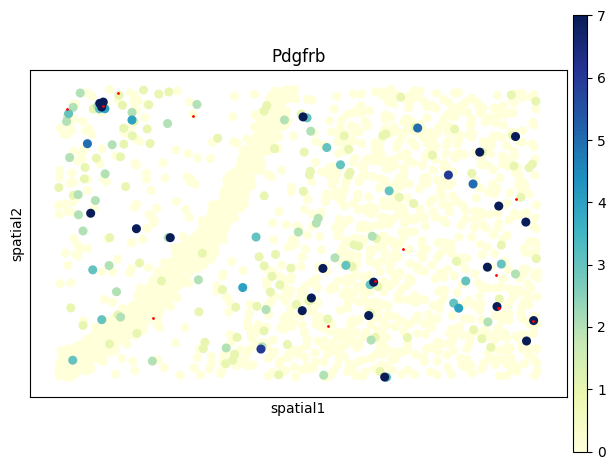

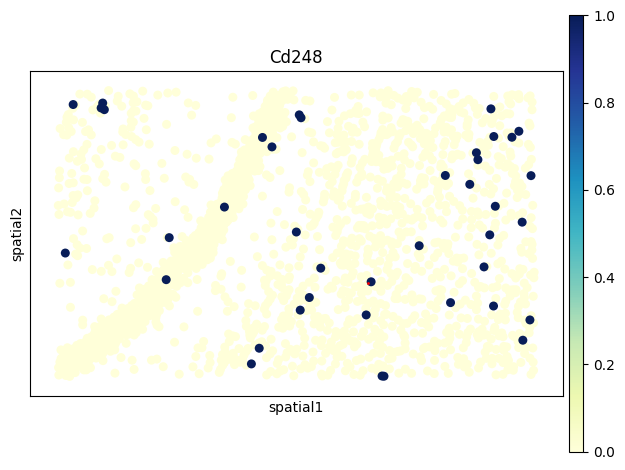

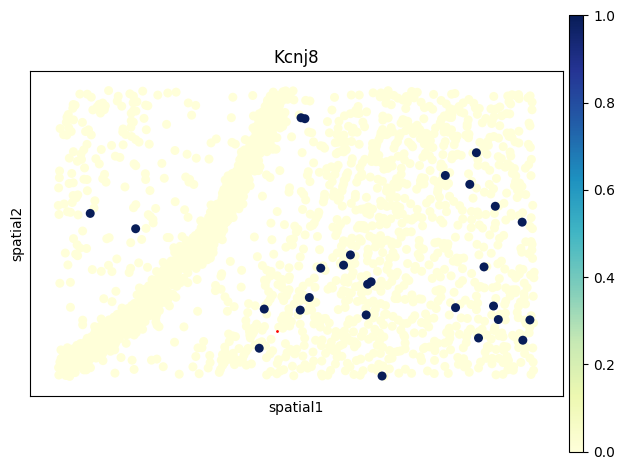

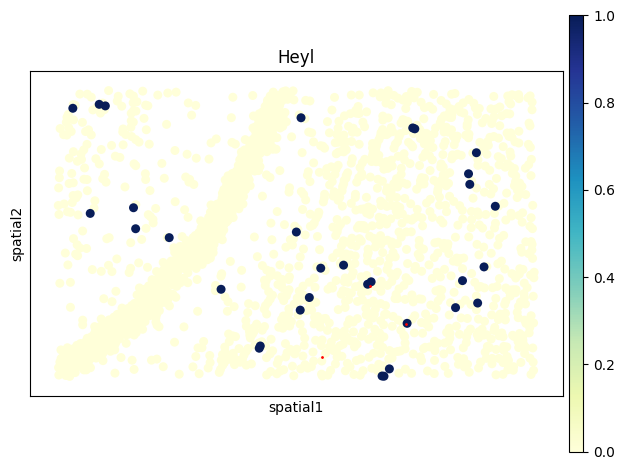

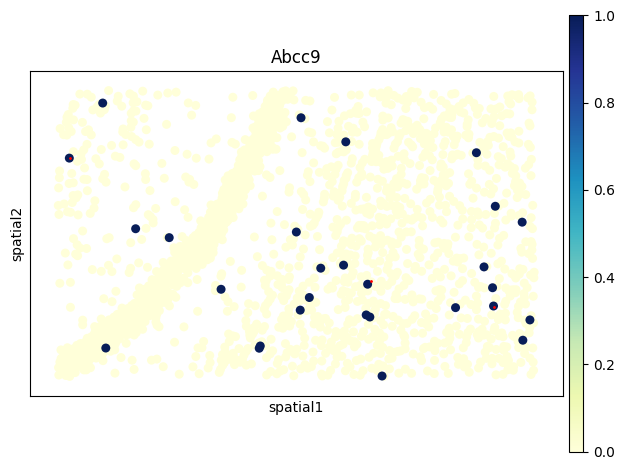

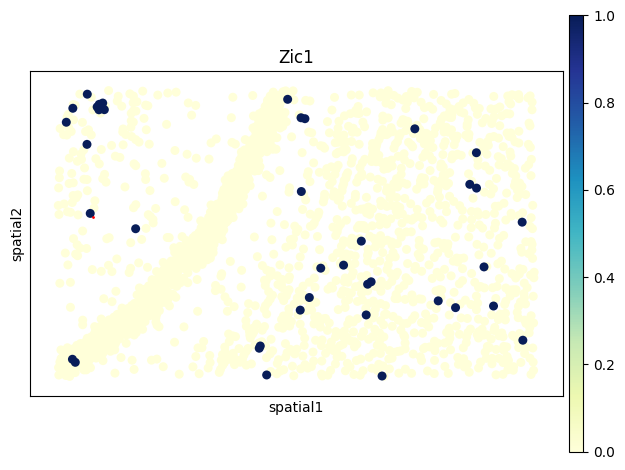

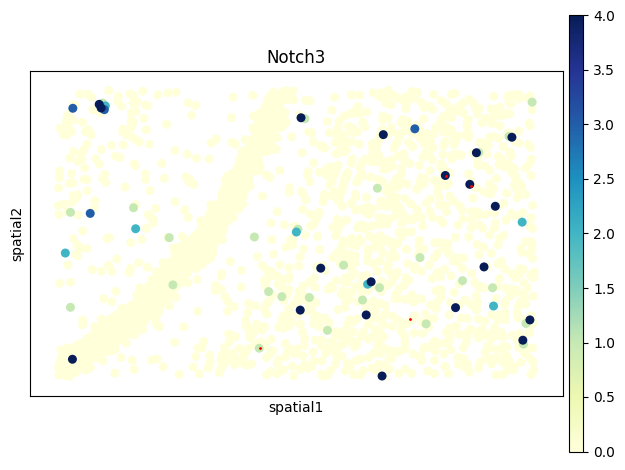

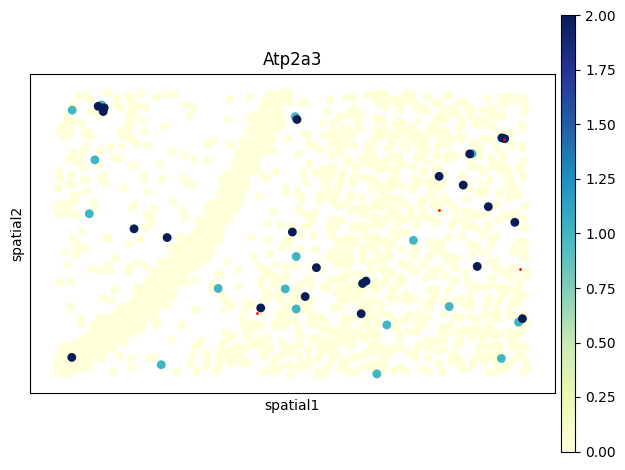

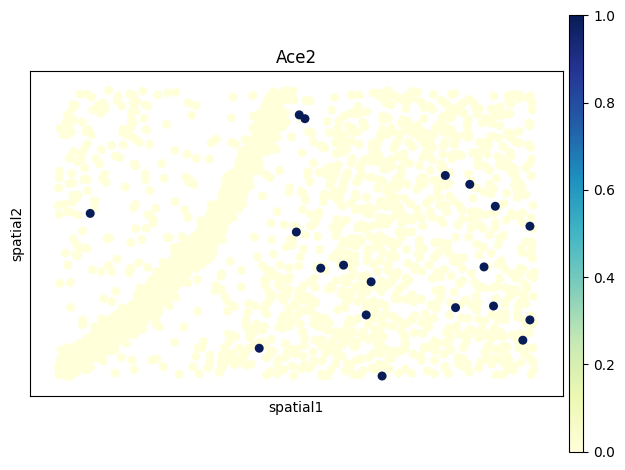

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


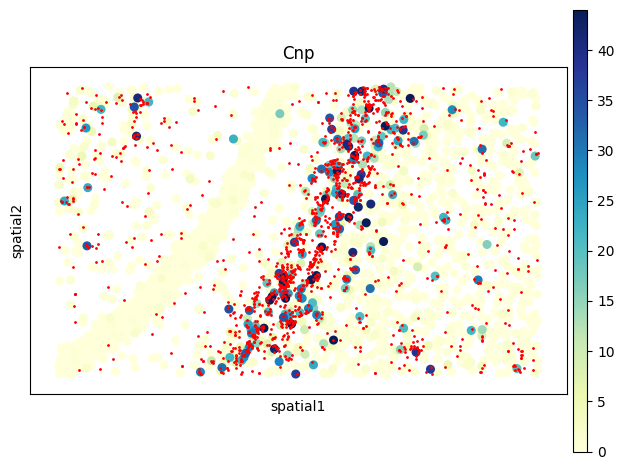

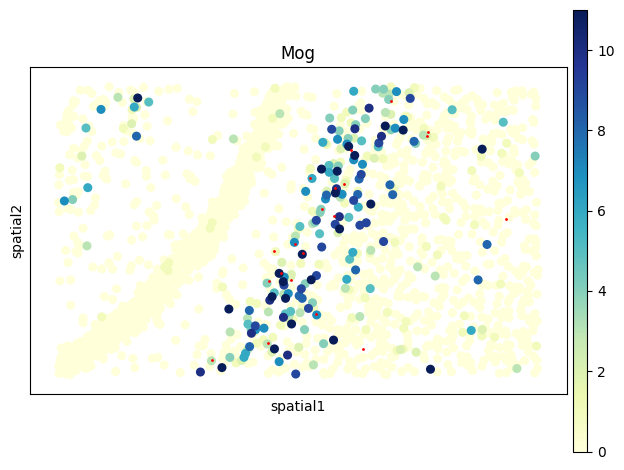

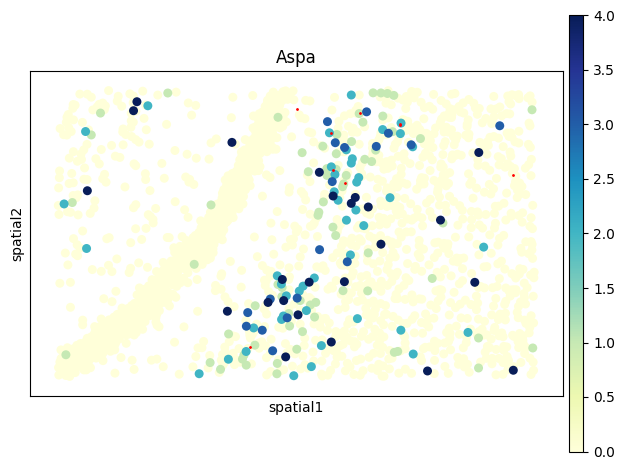

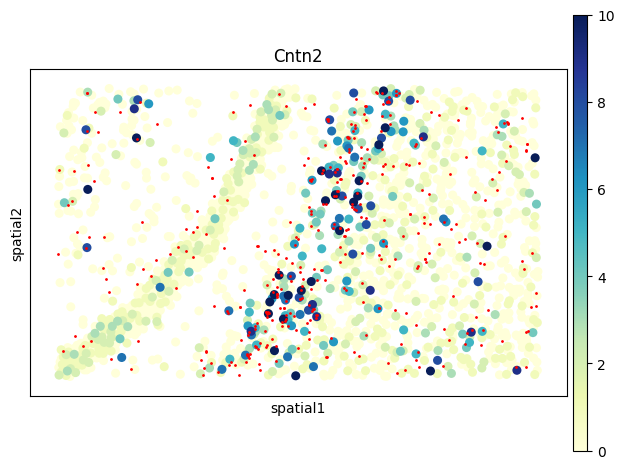

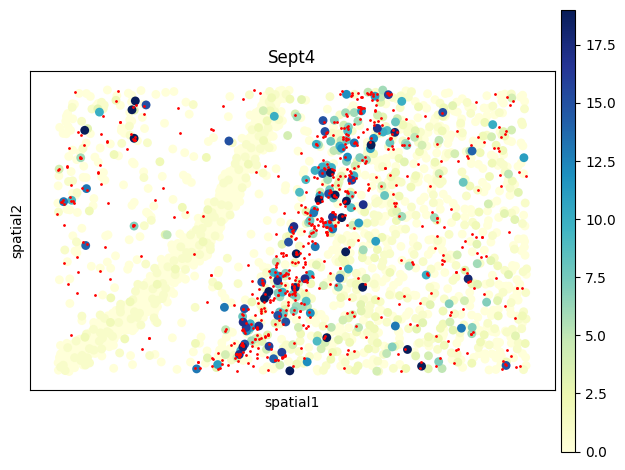

...

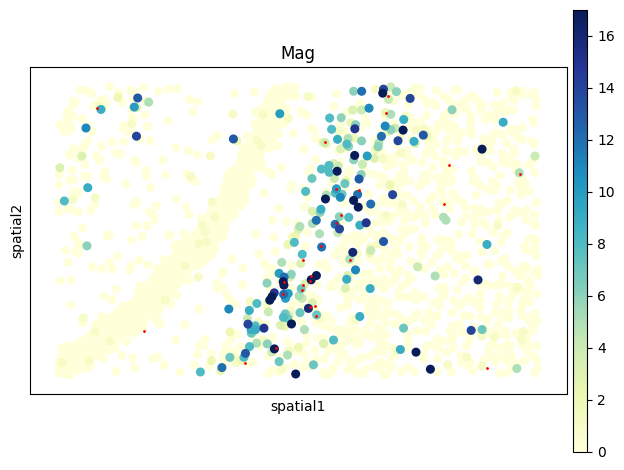

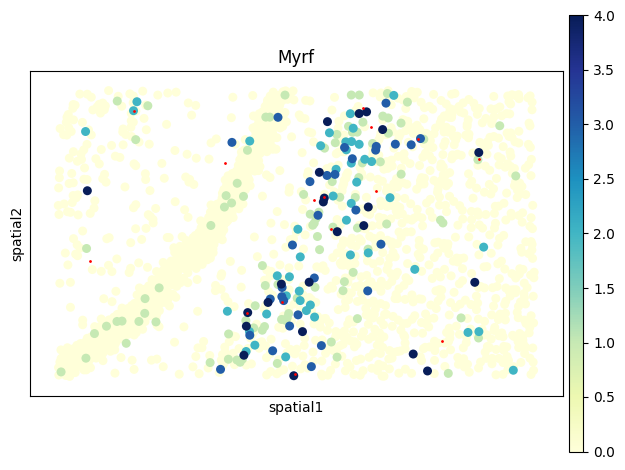

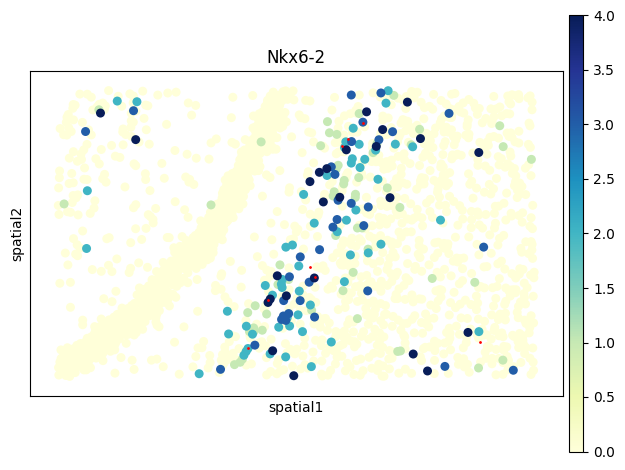

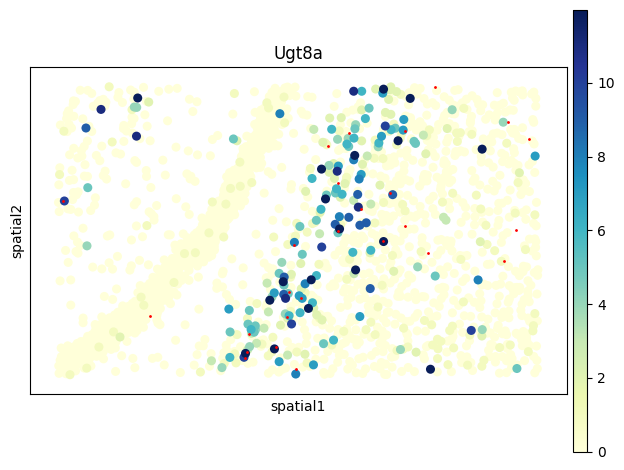

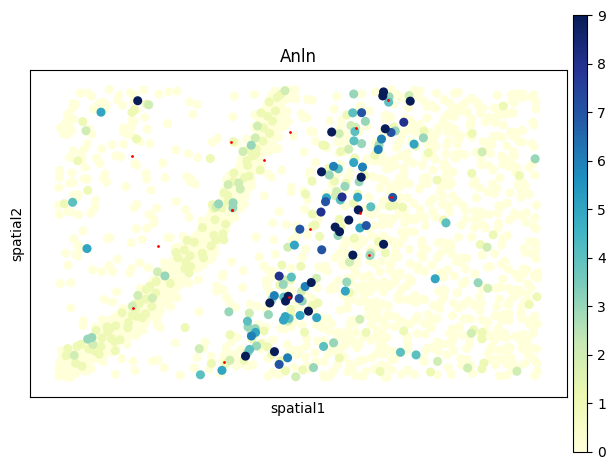

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


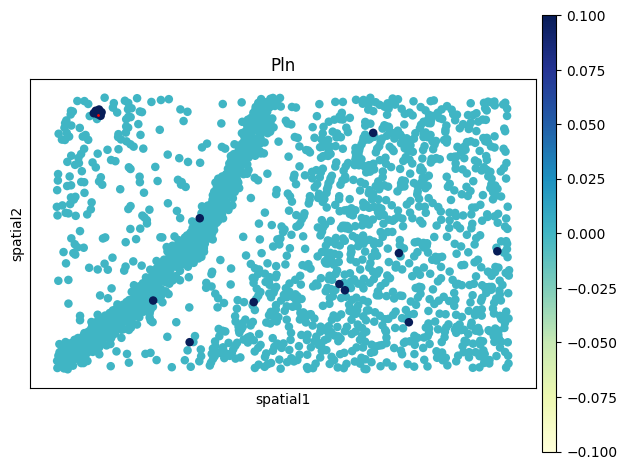

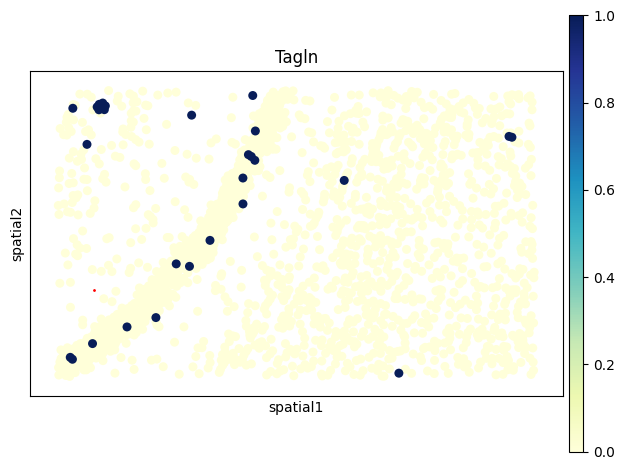

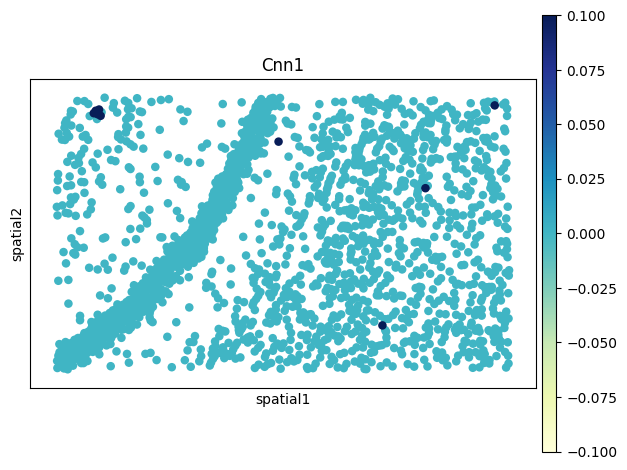

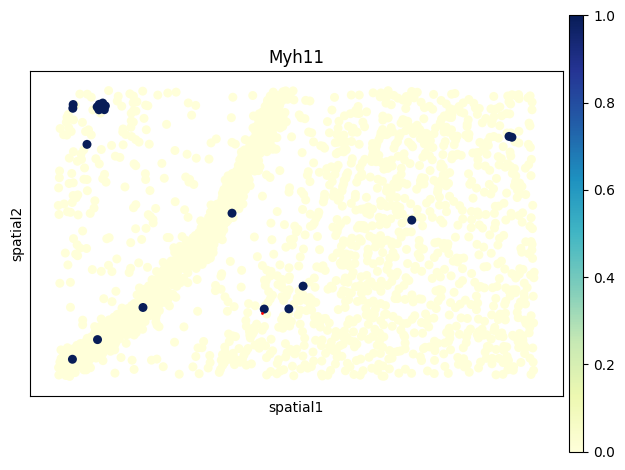

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


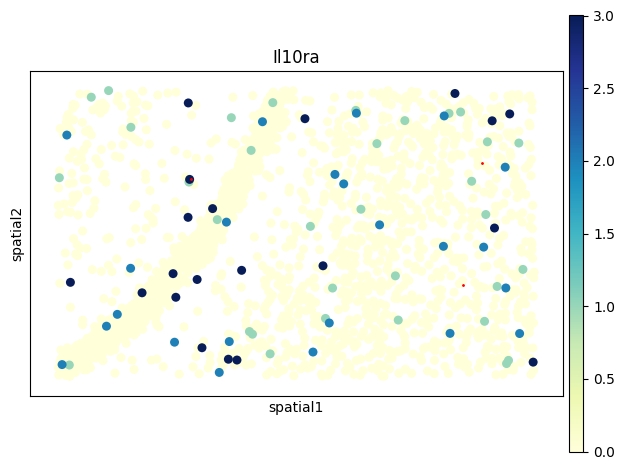

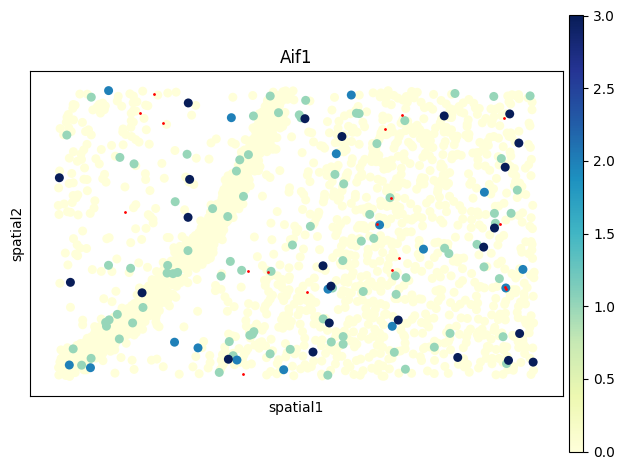

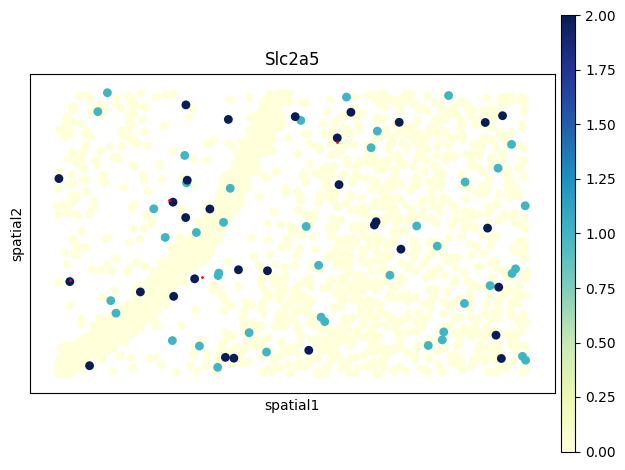

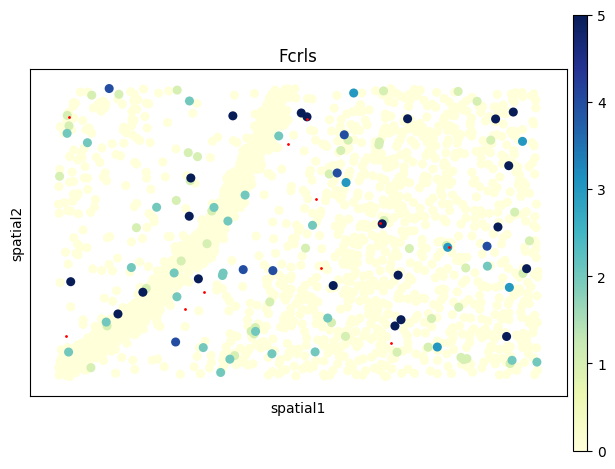

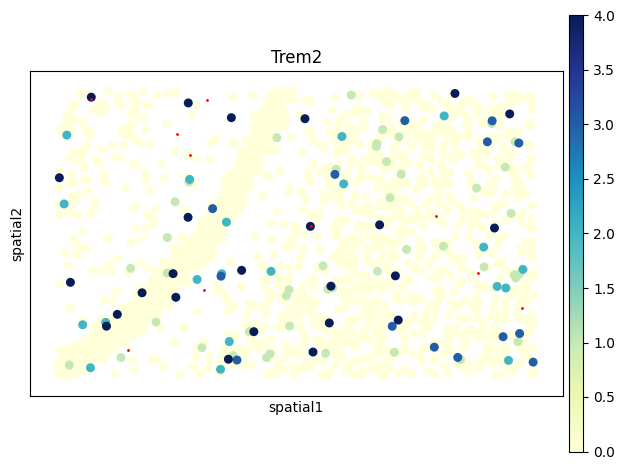

...

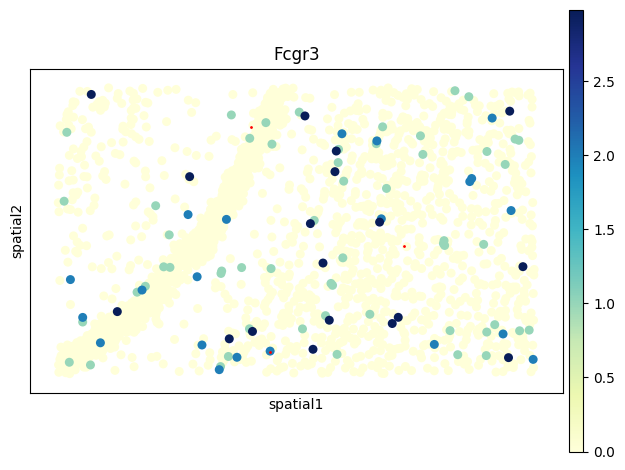

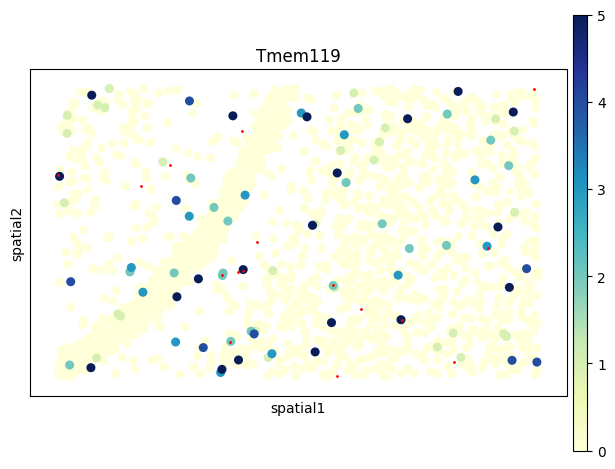

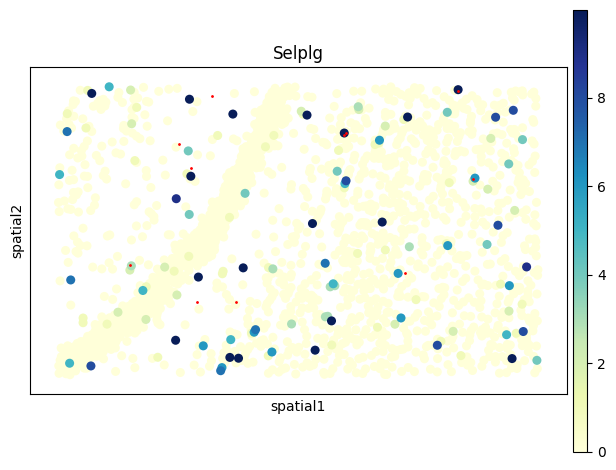

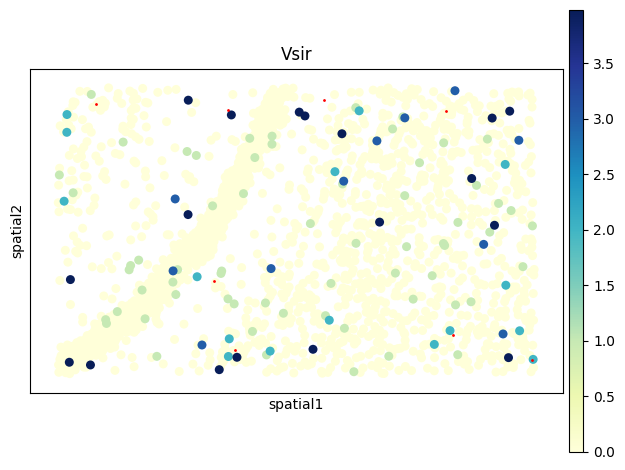

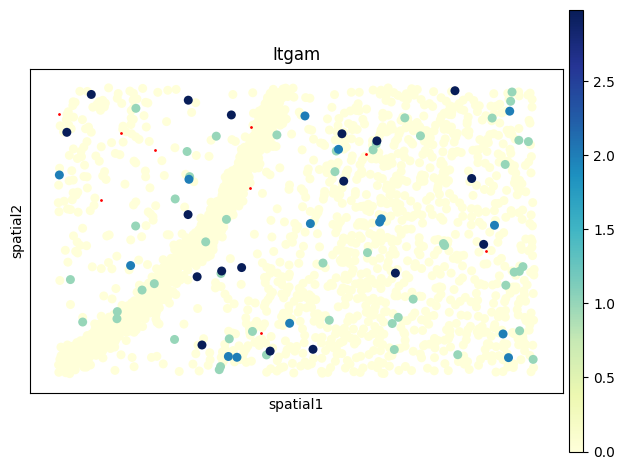

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


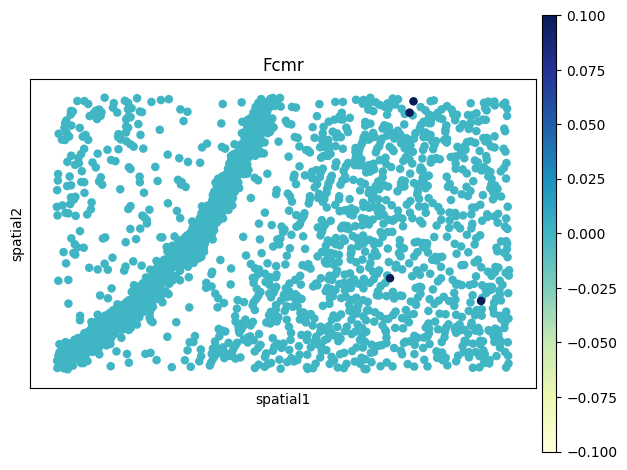

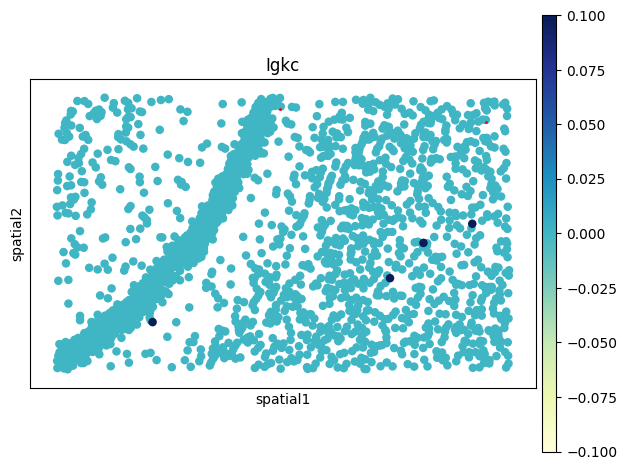

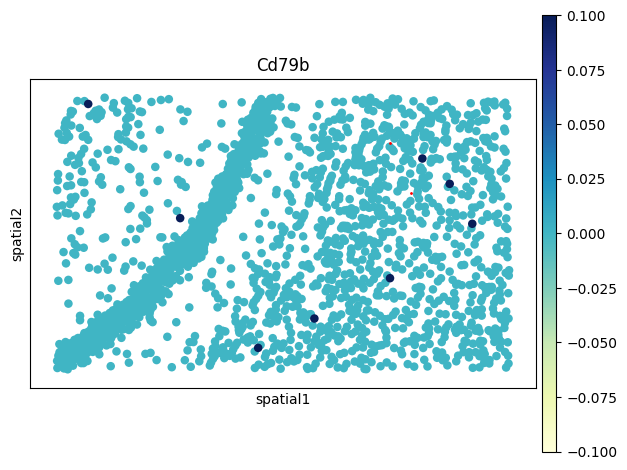

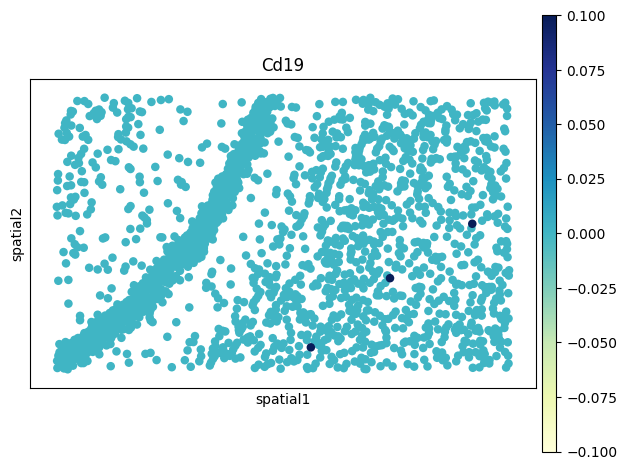

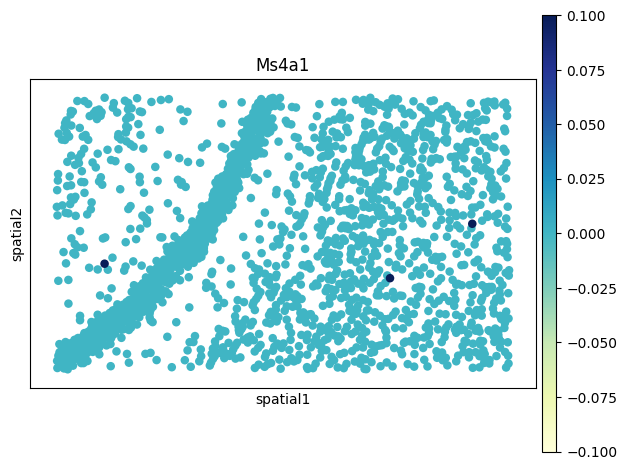

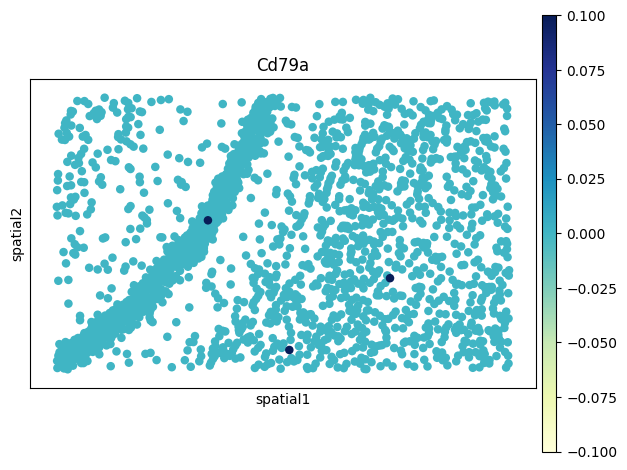

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


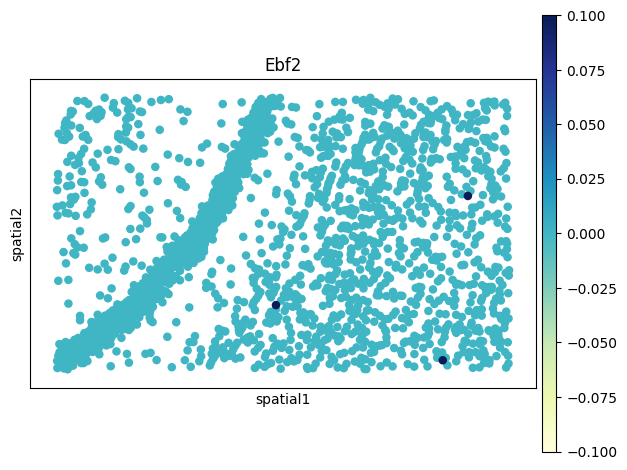

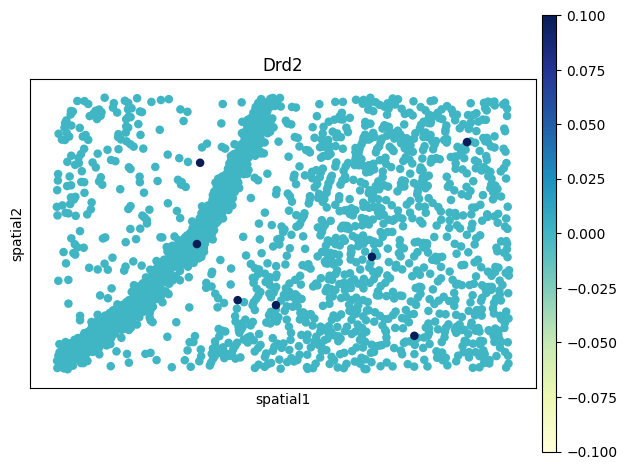

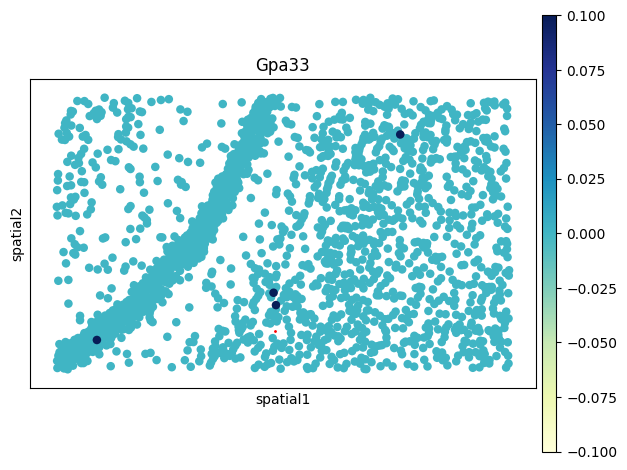

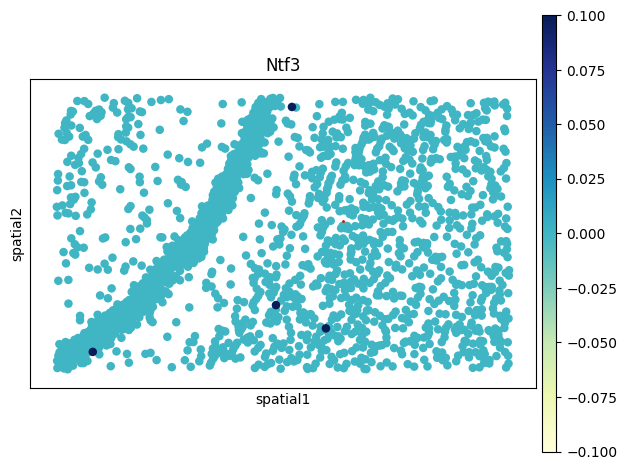

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


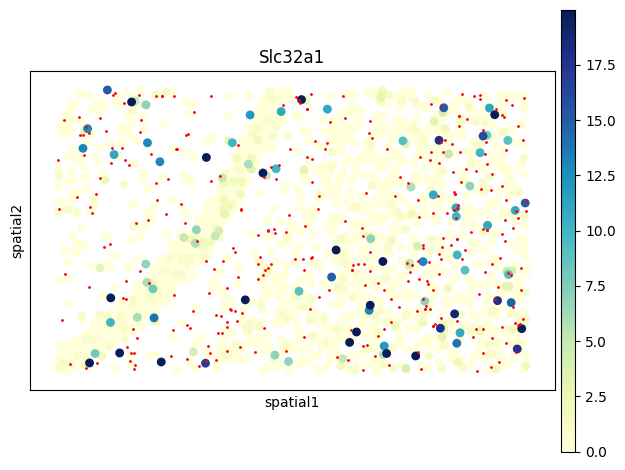

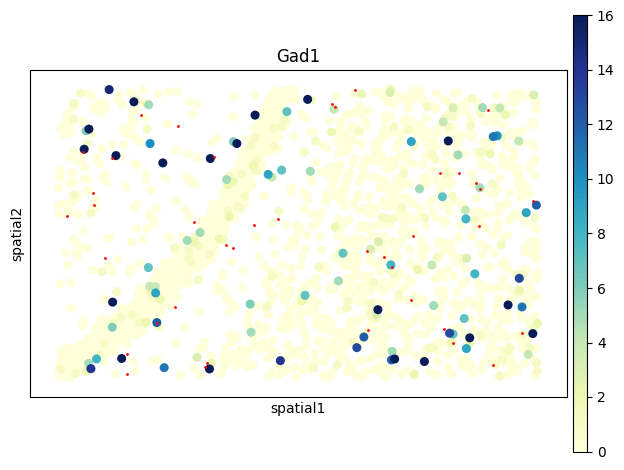

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


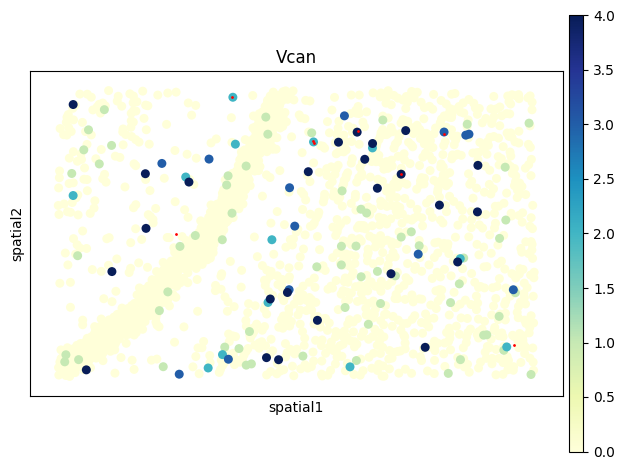

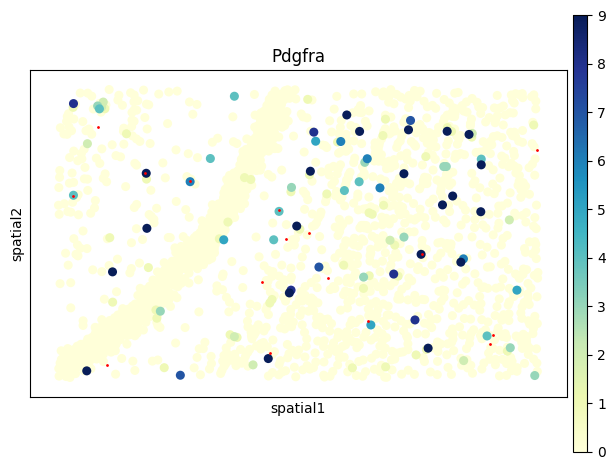

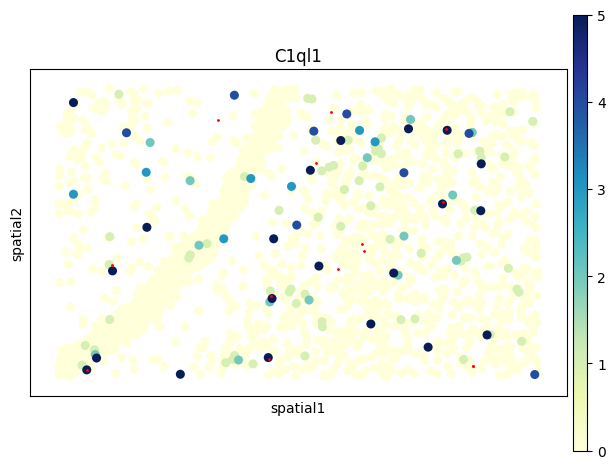

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


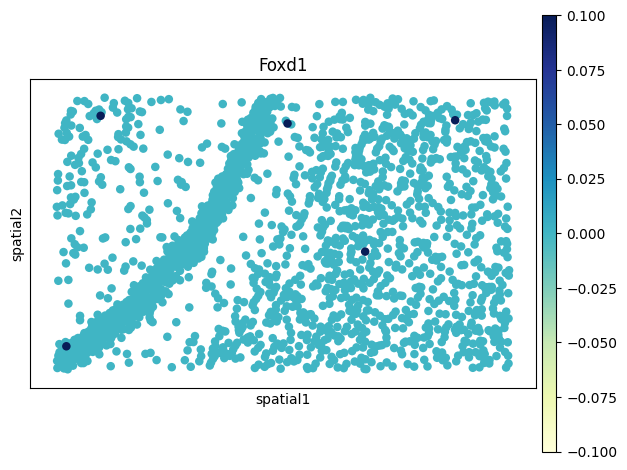

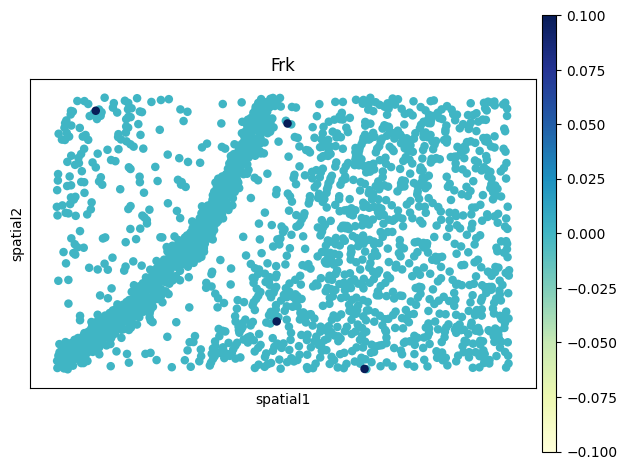

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


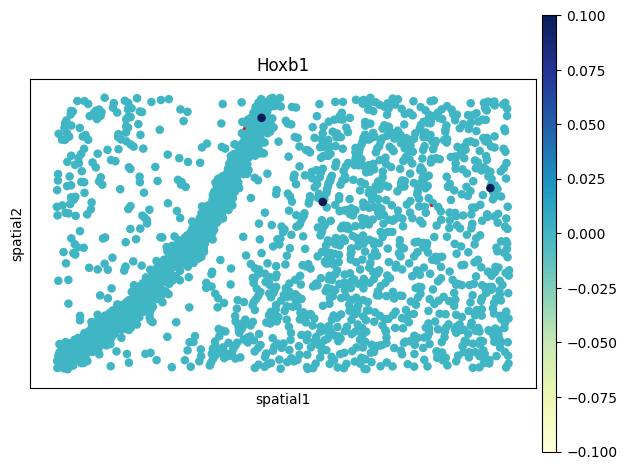

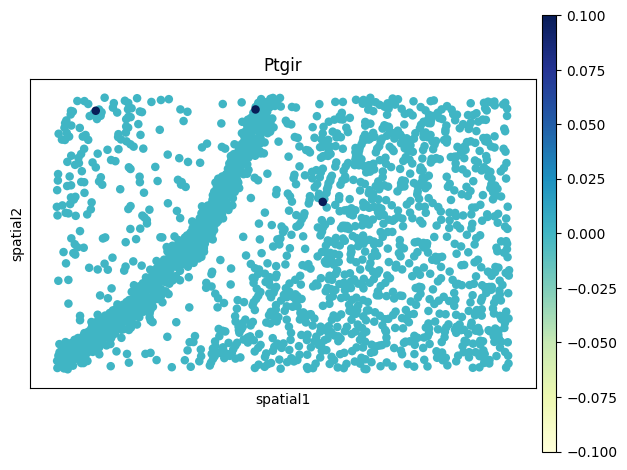

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


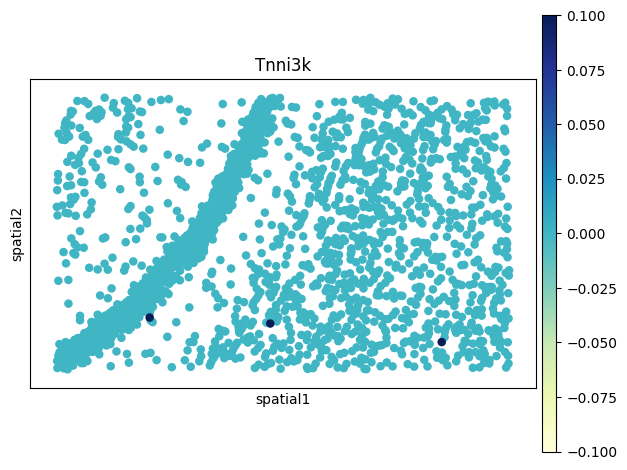

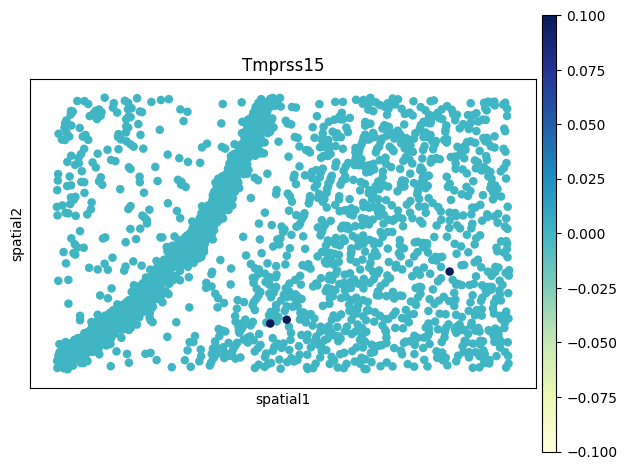

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


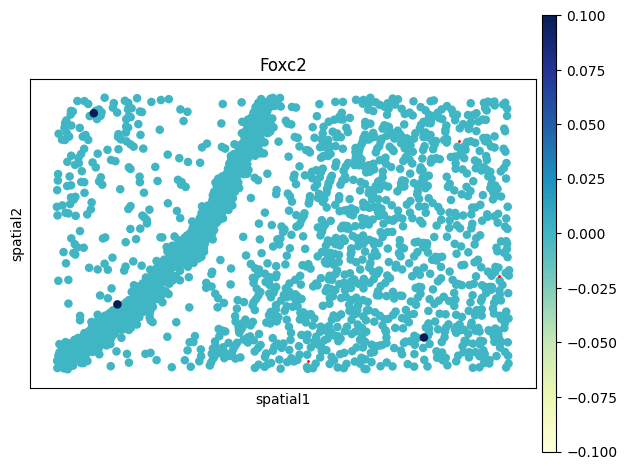

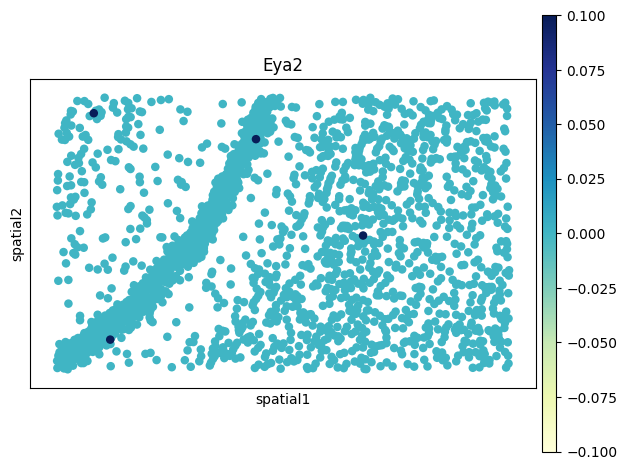

/home/sergio/anaconda3/envs/spatial_exrna/lib/python3.10/site-packages/dask/dataframe/core.py:4979: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  meta = self._meta[_extract_meta(key)]


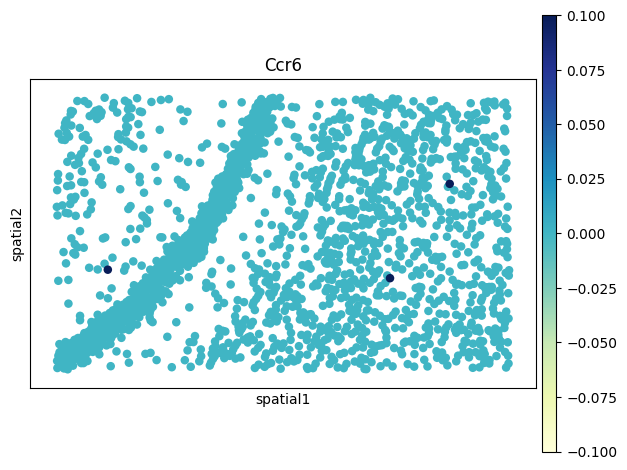

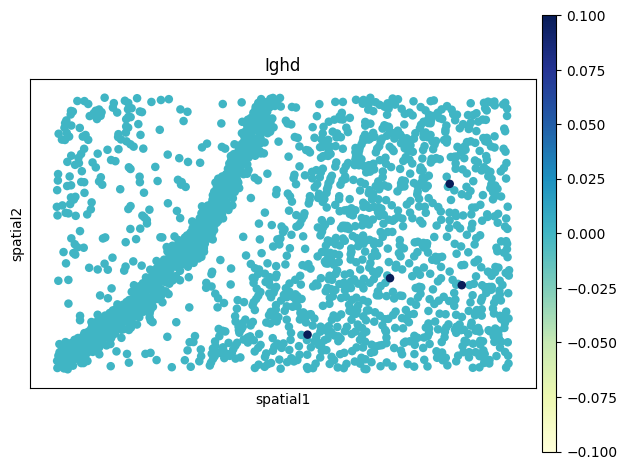

In [44]:

exrna=sdata['extracellular_transcripts']
for i, group in enumerate(gene_groups):
    genes_of_interest=exrna[exrna['feature_name'].compute().isin(group)].compute()
    for g in group:
    
         # Create a figure with two subplots: one for adata_annotated, one for adata
         fig, axs = plt.subplots(1, 1, )  # 1 row, 2 columns
    
         # Plot spatial map from adata
         sc.pl.spatial(adata, color=g, cmap='YlGnBu', title=g,
                  ax=axs, show=False, spot_size=20,vmax='p99')
         # Plot spatial map from adata_annotated
         plt.scatter(genes_of_interest.loc[genes_of_interest['feature_name']==g,'x'],genes_of_interest.loc[genes_of_interest['feature_name']==g,'y'],color='red',s=1)

        # Adjust layout and show the combined plot
         plt.tight_layout()
         plt.show()